<a href="https://www.kaggle.com/code/jacopodignazi/commnet?scriptVersionId=100719373" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
from pylab import rcParams
import seaborn as sb

import networkx as nx

from collections import Counter 

def dictoarr(dict, what='values'):
    if what=='values':
        return np.array(list(dict.values()))
    if what=='keys':
        return np.array(list(dict.keys()))



In [3]:
#--------------------------------------------------------------------------- inizializzazione grafo
N_AGENTS=200

# GRAPH_INIT='fully_c'
# GRAPH_INIT='alb_bar'
GRAPH_INIT='empty'
GRAPH_INIT_AB_M=1
# GRAPH_INIT='erd_rei'
GRAPH_INIT_ER_P=5/N_AGENTS


#--------------------------------------------------------------------------- settings opinioni
N_OPINIONS=4
# OPINION_INIT_METHOD='gauss'
# OPINION_INIT_METHOD='trunc_gauss'
OPINION_INIT_METHOD='uniform'

OPINION_INIT_MEAN=0.0
OPINION_INIT_VAR=0.3
# OPINION_NORM_METHOD='tanh'
OPINION_NORM_METHOD='bound'

#--------------------------------------------------------------------------- settings tolleranza 
# TOLL=-0.3
TOLL='uniform'
TOLL_INF=-1
TOLL_SUP=-TOLL_INF

#--------------------------------------------------------------------------- settings suscettibilità d'opinione
SUSCEPT=0.1

#--------------------------------------------------------------------------- settings similarità d'opinione
# SIMILARITY_OP_METRIC='cossim'
# SIMILARITY_OP_METRIC='scalar_tanh'
SIMILARITY_OP_METRIC='nrm_L1'

#--------------------------------------------------------------------------- settings inizializzazione peso connessione
# non viene usato se parto da inith_graph 'empty'
WEIGHT_INIT='constant'
WEIGHT_INIT_VALUE=0.5
# WEIGHT_INIT_VALUE='sim' # solo se weight_update è 'constant'
WEIGHT_INIT_TRASHOLD=0.

In [4]:

#--------------------------------------------------------------------------- settings evoluzione rete
N_STEPS=100

EVO_NET=True

WALK_ORDER=2
ITER_WEIGHT_SUM=True         #se la matrice di cammino è ottenuta sommando tutte le matrici di adiacenza fino all'ordine walk_order

INTERACTION_MINPROBA=0.2

# NEWIRE='none'               #se nessun nodo crea nuove connessioni
# NEWIRE='isolated'           #se a creare nuove connessioni sono solo i nodi senza connessioni
NEWIRE='all'                  #se tutti i nodi possono creare nuove connessioni (con probabilità 1/(1+#secondi vicini))
NEWIRE_EXP_DEG=1


# RND_NEIGH='uniform'
RND_NEIGH='weighted'

RND_NEIGH_SIM_PROPORTION=True #se true ogni nodo ha più probabilità (regolata dal parametro sotto) di interagire con chi ha già un'opinione simile
RND_NEIGH_SIM_PROPORTION_VALUE=1.
#NB trovo sia un modo artificiale di aumentare l'effetto di selezione che la rete farebbe di suo (se False) tramite il variare dei weight

PREFERENTIAL_ATTACHMENT=True
PREFERENTIAL_ATTACHMENT_TOLL_PROPORTION=False
PREFERENTIAL_ATTACHMENT_BASE_EXPONENT=1.0


#--------------------------------------------------------------------------- settings cambio d'opinione

SIM_PROPORTION=True
#se True le opinioni vengono modificate proporzionalmente alla similarity tra individui
SIM_NORM=np.tanh

TOLL_REPROP=0.8

STC_OP_VAR=True
# STC_DISTR=np.random.uniform
# STC_PAR1=-2
# STC_PAR2=-STC_PAR1
STC_DISTR=np.random.normal
STC_PAR1=0
STC_PAR2=0.5

#--------------------------------------------------------------------------- settings evoluzione peso connessione

WEIGHT_DECAY=0.01               #valore da 0,1 da sottrarre ad ogni connessione ad ogni iterazione (se weight<=0 l'edge viene rimosso)

# combinazioni di pos/abs e sim/interaction  (NB da versione 30 pos è OMESSO perché implicito)         
# WEIGHT_METRIC='sim'           #se sim viene calcolata in base alla similarità di opinione                    
WEIGHT_METRIC='interaction'   #se interaction viene calcolata in base al valore passato nell'iterazione, relativo all'esito dell'interazione tra i due nodi
# WEIGHT_METRIC='abs_sim'       #se pos vengono considerati solo valori positivi, 
# WEIGHT_METRIC='abs_interaction'       #se abs viene dato più peso alle interazioni più significative (in negativo o positivo)

WEIGHT_NORM='bound'     

# WEIGHT_UPDATE='constant'        #se agli edge tra i nodi interagenti viene attribuito un certo peso ex novo (eventuamente calcolato su metrica)
WEIGHT_UPDATE='additive'             #o se la connessione tra nodi interagenti varia additivamente 
PROBABILISTIC_WIRING=False       #se le nuove connessioni vengono stabilite con probabilità (relativa a valori calcolati con metodi da stabilire)
if PROBABILISTIC_WIRING:
    WEIGHT_UPDATE+="_proba"
WEIGHT_SUSCEPT=0.1      #viene usata per weight_update='additive'
    
# WEIGHT_UPDATE_INIT='constant' #se alle nuove connessioni viene attribuito un peso fisso (constant)  
WEIGHT_UPDATE_INIT='metric'           #o da calcolare con metrica sui pesi
WEIGHT_UPDATE_INIT_VALUE=0.1      #viene usato solo se weight_update_init è constant.

WEIGHT_UPDATE_TRASHOLD=0

# SE DUE NODI INTERAGISCONO si calcola un valore che quantifica il peso dell'interazione
# ---->WEIGHT_METRIC stabilisce come calcolare i valori da usare nel calcolo del nuovo peso
# SE LA CONNESSIONE ERA GIA' PRESENTE viene aggiornata
# ---->WEIGHT_UPDATE stabilisce come i valori calcolati con weight metric devono essere usati (presi come valori ex novo o da aggiungere a quello esistente)
# SE LA CONNESSIONE NON ERA PRESENTE si valuta se aggiungere questo edge alla rete
# ---->PROBABILISTIC_WIRING stabilisce come valutare di aggiungere nuove connessioni
# SE SI STABILISCE UNA NUOVA CONNESSIONE si fissa un valore iniziale
# ---->WEIGHT_UPDATE_INIT stabilisce il valore iniziali delle nuove connessioni ( da assumere come valori dati o da calcolare con metric )

#--------------------------------------------------------------------------- settings metriche

METRIC_STEP=10

TOPPROP_WEIGHTED=False

OPINION_DISCR_BINS=5


#--------------------------------------------------------------------------- settings visualizzazione

# LAYOUT_MODE='fixed'
LAYOUT_MODE='previous'
LAYOUT_FIXED_POS_SET_AT_STEP=60     #usata solo se layout_mode='fixed'
LAYOUT_FIXED_ITER=100
LAYOUT_STEP=10                      #usata solo se layout_mode='previous'

LAYOUT_DRAW_FUNCTION=nx.draw
LAYOUT_ITER=50
LAYOUT_SCALE=1
LAYOUT_EXP=0.2
LAYOUT_OPT_DIST=1/(N_AGENTS**LAYOUT_EXP)

LAYOUT_PLOTS=(7,5)


STEP_VIS=50
WEIGHT_TRASHOLD=0.0

BINARY_CMAP=plt.cm.cool
TERNARY_CMAP=plt.cm.jet

Critical Settings

In [5]:
allow_par_redef=True     #solo per comodità

def redef_critical_par():
    global N_AGENTS
    global N_OPINIONS
    global N_STEPS
    global WEIGHT_DECAY
    global WEIGHT_SUSCEPT
    global INTERACTION_MINPROBA
    global WALK_ORDER
    global ITER_WEIGHT_SUM
    global NEWIRE_EXP_DEG
    global RND_NEIGH_SIM_PROPORTION_VALUE
    global PREFERENTIAL_ATTACHMENT_BASE_EXPONENT
    global TOLL_REPROP
    global STC_DISTR
    global STC_PAR1
    global STC_PAR2
    
    N_AGENTS=250
    N_OPINIONS=1
    N_STEPS=250

    WEIGHT_DECAY=0.001
    WEIGHT_SUSCEPT=0.1
    
    INTERACTION_MINPROBA=0.3
    WALK_ORDER=2
    ITER_WEIGHT_SUM=True
    NEWIRE_EXP_DEG=2.
    RND_NEIGH_SIM_PROPORTION_VALUE=1.
    PREFERENTIAL_ATTACHMENT_BASE_EXPONENT=1.0
    
    TOLL_REPROP=0.8
    STC_DISTR=np.random.normal
    STC_PAR1=0
    STC_PAR2=0.5

if allow_par_redef:
    redef_critical_par()
    


Showing given settings

In [6]:
def display_settings():
    print("--------------------------------------------------------------------------- settings inizializzazione grafo")
    print("N_AGENTS:", N_AGENTS)

    print("GRAPH_INIT:",GRAPH_INIT)
    if GRAPH_INIT=='alb_bar':
        print("GRAPH_INIT_AB_M:",GRAPH_INIT_AB_M)
    if GRAPH_INIT=='erd_rei':
        print("GRAPH_INIT_ER_P:",GRAPH_INIT_ER_P)


    print("--------------------------------------------------------------------------- settings opinioni")
    print("N_OPINIONS:", N_OPINIONS)
    print("OPINION_INIT_METHOD:",OPINION_INIT_METHOD)
    if 'gauss' in OPINION_INIT_METHOD:
        print("OPINION_INIT_MEAN:",OPINION_INIT_MEAN)
        print("OPINION_INIT_VAR:",OPINION_INIT_VAR)
    print("OPINION_NORM_METHOD:",OPINION_NORM_METHOD)

    print("--------------------------------------------------------------------------- settings tolleranza")
    print("TOLL:",TOLL)
    if TOLL=='uniform':
        print("TOLL_INF:",TOLL_INF)
        print("TOLL_SUP:",TOLL_SUP)

    print("--------------------------------------------------------------------------- settings suscettibilità")
    print("SUSCEPT:",SUSCEPT)

    print("--------------------------------------------------------------------------- settings similarità d'opinione")
    print("SIMILARITY_OP_METRIC:",SIMILARITY_OP_METRIC)
    
    if GRAPH_INIT!='empty':
        print("#--------------------------------------------------------------------------- settings inizializzazione peso connessione")
        print("WEIGHT_INIT:",WEIGHT_INIT)
        print("WEIGHT_INIT_VALUE:",WEIGHT_INIT_VALUE)
        print("WEIGHT_INIT_TRASHOLD:",WEIGHT_INIT_TRASHOLD)
    
    print("--------------------------------------------------------------------------- settings generali di evoluzione")
    print("N_STEPS:",N_STEPS)

    print("EVO_NET:",EVO_NET)
    
    print("INTERACTION_MINPROBA:", INTERACTION_MINPROBA)

    print("WALK_ORDER:",WALK_ORDER)
    print("ITER_WEIGHT_SUM:",ITER_WEIGHT_SUM)     
    print("--------------------------------------------------------------------------- settings scelta del nodo interagente")
    print("NEWIRE:",NEWIRE)
    if NEWIRE=='all':
        print("NEWIRE_EXP_DEG:",NEWIRE_EXP_DEG)

    print("RND_NEIGH:",RND_NEIGH)

    print("RND_NEIGH_SIM_PROPORTION:",RND_NEIGH_SIM_PROPORTION)
    if RND_NEIGH_SIM_PROPORTION:
        print("RND_NEIGH_SIM_PROPORTION_VALUE:",RND_NEIGH_SIM_PROPORTION_VALUE)
        
    print("--------------------------------------------------------------------------- settings preferential attachment")

    print("PREFERENTIAL_ATTACHMENT:",PREFERENTIAL_ATTACHMENT)
    if PREFERENTIAL_ATTACHMENT:
        print("PREFERENTIAL_ATTACHMENT_BASE_EXPONENT:",PREFERENTIAL_ATTACHMENT_BASE_EXPONENT)
        print("PREFERENTIAL_ATTACHMENT_TOLL_PROPORTION:", PREFERENTIAL_ATTACHMENT_TOLL_PROPORTION)

    print("--------------------------------------------------------------------------- settings cambio d'opinione")

    print("SIM_PROPORTION:",SIM_PROPORTION)
    print("SIM_NORM:",SIM_NORM)
    
    print("TOLL_REPROP:", TOLL_REPROP)

    print("STC_OP_VAR:",STC_OP_VAR)
    print("STC_DISTR:",STC_DISTR)
    print("STC_PAR1:",STC_PAR1)
    print("STC_PAR2:",STC_PAR2)

    if EVO_NET:
        print("--------------------------------------------------------------------------- settings evoluzione peso connessione")

        print("WEIGHT_DECAY:", WEIGHT_DECAY)              

        print("WEIGHT_METRIC:",  WEIGHT_METRIC)     

        print("WEIGHT_NORM:",  WEIGHT_NORM)  

        print("WEIGHT_UPDATE:", WEIGHT_UPDATE )         
        print("PROBABILISTIC_WIRING:",PROBABILISTIC_WIRING)      
        print("WEIGHT_SUSCEPT:", WEIGHT_SUSCEPT)

        if WEIGHT_UPDATE=='constant':
              print("WEIGHT_UPDATE_INIT:", WEIGHT_UPDATE_INIT) 
              print("WEIGHT_UPDATE_INIT_VALUE:",WEIGHT_UPDATE_INIT_VALUE)     

        print("WEIGHT_UPDATE_TRASHOLD:",WEIGHT_UPDATE_TRASHOLD)
        
    print("--------------------------------------------------------------------------- settings metriche")
    print("METRIC_STEP:",METRIC_STEP)
    print("TOPPROP_WEIGHTED:",TOPPROP_WEIGHTED)
    print("OPINION_DISCR_BINS:",OPINION_DISCR_BINS)

    print("--------------------------------------------------------------------------- settings visualizzazione")
    print("LAYOUT_MODE:",LAYOUT_MODE)
    if LAYOUT_MODE=='fixed':
        print("LAYOUT_FIXED_POS_SET_AT_STEP:",LAYOUT_FIXED_POS_SET_AT_STEP)
    else:
        print("LAYOUT_STEP:", LAYOUT_STEP)
        

    print("LAYOUT_DRAW_FUNCTION:",LAYOUT_DRAW_FUNCTION)
    print("LAYOUT_ITER:",LAYOUT_ITER)
    print("LAYOUT_SCALE:",LAYOUT_SCALE)
    print("LAYOUT_EXP:",LAYOUT_EXP)
    print("LAYOUT_OPT_DIST:",LAYOUT_OPT_DIST)

    print("STEP_VIS:",STEP_VIS)
    print("WEIGHT_TRASHOLD:",WEIGHT_TRASHOLD)

    print("BINARY_CMAP:",BINARY_CMAP)
    print("TERNARY_CMAP:",TERNARY_CMAP)


display_settings()    

--------------------------------------------------------------------------- settings inizializzazione grafo
N_AGENTS: 250
GRAPH_INIT: empty
--------------------------------------------------------------------------- settings opinioni
N_OPINIONS: 1
OPINION_INIT_METHOD: uniform
OPINION_NORM_METHOD: bound
--------------------------------------------------------------------------- settings tolleranza
TOLL: uniform
TOLL_INF: -1
TOLL_SUP: 1
--------------------------------------------------------------------------- settings suscettibilità
SUSCEPT: 0.1
--------------------------------------------------------------------------- settings similarità d'opinione
SIMILARITY_OP_METRIC: nrm_L1
--------------------------------------------------------------------------- settings generali di evoluzione
N_STEPS: 250
EVO_NET: True
INTERACTION_MINPROBA: 0.3
WALK_ORDER: 2
ITER_WEIGHT_SUM: True
--------------------------------------------------------------------------- settings scelta del nodo interagente
NE

Graph inizialization


In [7]:
if GRAPH_INIT=='fully_c':
    init_net=nx.complete_graph(N_AGENTS)
elif GRAPH_INIT=='erd_rei':
    init_net=nx.erdos_renyi_graph(N_AGENTS, GRAPH_INIT_ER_P)
elif GRAPH_INIT=='alb_bar':
    init_net=nx.barabasi_albert_graph(N_AGENTS, GRAPH_INIT_AB_M)
elif GRAPH_INIT=='empty':
    init_net=nx.Graph()
    init_net.add_nodes_from(range(N_AGENTS))


Assigning Tolerances

In [8]:
if type(TOLL) is not str:
    for node in init_net.nodes():
        init_net.nodes[node]['tolerance']=TOLL
elif TOLL=='uniform':
    for node in init_net.nodes():
        init_net.nodes[node]['tolerance']=np.random.uniform(TOLL_INF, TOLL_SUP)
    

Assigning susceptibility

In [9]:
#implementato solo per avere LO STESSO VALORE PER TUTTI I NODI, COSTANTE PER TUTTO IL TEMPO

if type(SUSCEPT) is not str:
    for node in init_net.nodes():
        init_net.nodes[node]['suscept']=SUSCEPT

Assigning interaction_probability

In [10]:
#implementato solo per avere LO STESSO VALORE PER TUTTI I NODI, COSTANTE PER TUTTO IL TEMPO

if type(INTERACTION_MINPROBA) is not str:
    for node in init_net.nodes():
        init_net.nodes[node]['interaction_proba']=INTERACTION_MINPROBA

Visualizing initial graph

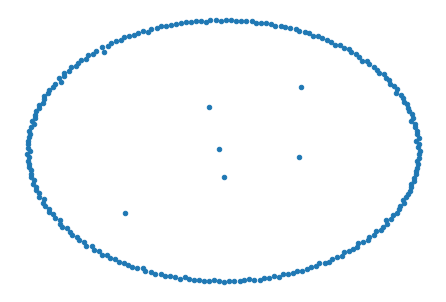

In [11]:
init_pos= nx.spring_layout(init_net,  iterations=500)
nx.draw(init_net, pos=init_pos, node_size=20)

if LAYOUT_MODE=='fixed':
    if LAYOUT_FIXED_POS_SET_AT_STEP==0:
        LAYOUT_POS=init_pos
if LAYOUT_MODE=='previous':
    LAYOUT_POS=init_pos

Initial degree distribution

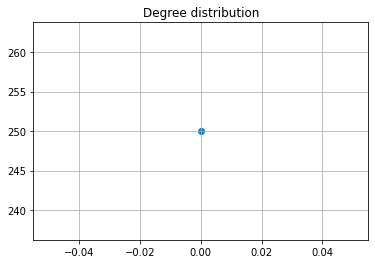

In [12]:

DEFAULT_SCALE=None

def deg_dist(graph, out='count', display=True, scale=DEFAULT_SCALE, plot_layout=None, title='Degree distribution'): #plot_function=plt.scatter):
    degs=dict(graph.degree()).values()
    degree_dist=Counter(degs)
    degree_dist=sorted(degree_dist.items())
    if out == 'proba':
        tot_degree=len(graph.edges())
        if tot_degree!=0:
            degree_dist=[[deg, occ/tot_degree] for deg,occ in degree_dist]
        else:
            degree_dist=[[deg, 0] for deg,occ in degree_dist]
       
    dd=np.array(degree_dist) 
    if display==True:
        if plot_layout!=None:
            plt.subplot(plot_layout[0], plot_layout[1], plot_layout[2])
        ax = plt.gca()
        ax.scatter(dd[:,0], dd[:,1])
        if scale!=None:
            ax.set_yscale(scale)
            ax.set_xscale(scale)
        ax.set_title(title)
        plt.grid()
        if plot_layout==None:
            plt.show()
    return dd

deg_dist(init_net, display=True)
print()

In [13]:
import copy

def neigh_list(graph, node_id, order=1, add_low_order=True, exclude_self=True, get_data=None):
    first_neigh=list(graph.neighbors(node_id))
    
    if order==1:
        return first_neigh
    
    if add_low_order:
        order_neigh=copy.deepcopy(first_neigh)
    else:
        order_neigh=[]
        
    for f_nei in first_neigh:
        if len(order_neigh)==len(graph.nodes()):
            break
            
        #search for first order neigh of f_nei    
        next_order_neigh=neigh_list(graph, f_nei, order=order-1)
        for node in next_order_neigh:
            if node not in order_neigh:
                order_neigh.append(node)
       
    if exclude_self:
        if node_id in order_neigh:
            order_neigh.remove(node_id)
            
    if get_data==None:
        return order_neigh
           
# neigh_list(Gr,2, order=2)  

# def neigh_proba(graph, node_id, order=1, use_weight=True):
#     n_dict={}
#     n_list=neigh_list(graph, node_id, order=order)
#     for node in n_list:
#         n_dict[node]=0
        
    

Initializing Opinions

In [14]:
if OPINION_INIT_METHOD=='gauss':
    Opinion_matrix=np.random.normal(OPINION_INIT_MEAN, OPINION_INIT_VAR, size=(N_AGENTS,N_OPINIONS))

elif OPINION_INIT_METHOD=='uniform':
    Opinion_matrix=np.random.uniform(-1, 1, size=(N_AGENTS,N_OPINIONS))    
    
elif OPINION_INIT_METHOD=='trunc_gauss':
    Opinion_matrix=[]
    for i in range(N_AGENTS):
        Opinion_matrix.append([])
        for j in range(N_OPINIONS):
            nrm_value=np.random.normal(OPINION_INIT_MEAN, OPINION_INIT_VAR)
            while( np.abs(nrm_value)>1 ):
                nrm_value=np.random.normal()
            Opinion_matrix[i].append(nrm_value)
    Opinion_matrix=np.array(Opinion_matrix)    
            
            
Opinion_matrix.shape     

(250, 1)

In [15]:
# help(nx.Graph)
for n, opinion in enumerate(Opinion_matrix):
    init_net.nodes[n]['opinion']=opinion

def normalize_opinions(graph, method=OPINION_NORM_METHOD):
    if method=='tanh':
        for node in graph.nodes():
            op=graph.nodes[node]['opinion']
            graph.nodes[node]['opinion']=np.tanh(op)
            
    elif method=='minmax_lin':
        opinion_array=np.array(list(nx.get_node_attributes(graph, 'opinion').values()))
        max=np.array( [arg_op.max() for arg_op in opinion_array.T] )
        min=np.array( [arg_op.min() for arg_op in opinion_array.T] )
        shift=(max-np.abs(min))/2
        shrink=2/(max-min)
        new_op_array=(opinion_array-shift)*shrink
        for n, op in enumerate(new_op_array):
            graph.nodes[n]['opinion']=op
            
    elif method=='bound':
        INF_BOUND=-0.99
        SUP_BOUND=0.99
        for node in graph.nodes():
            op_array=graph.nodes[node]['opinion']
            bounded_op_array=[]
            for op in op_array:
                if op<INF_BOUND:
                    bounded_op_array.append(INF_BOUND)
                elif op>SUP_BOUND:
                    bounded_op_array.append(SUP_BOUND) 
                else:
                    bounded_op_array.append(op)
            graph.nodes[node]['opinion']=np.array(bounded_op_array)
        
    elif method.lower()=='none':
        return


Setting extr_score 

In [16]:
def set_extr_score(graph):
    for node in graph.nodes():
        op=graph.nodes[node]['opinion']
        graph.nodes[node]['extr_score']=np.abs(op).mean()
        
set_extr_score(init_net)

Setting Discrete Opinion Category

In [17]:
OPINION_DISCR_BINS=5

def set_disc_op_category(graph, N_BINS=OPINION_DISCR_BINS):   #NON TESTATA PER N_OPINIONS>1
#     N_OPINIONS
#     OPINION_DISCR_BINS
    delta=2/N_BINS
    check_counter=0
    
    id_mult=np.array([N_BINS**d for d in range(N_OPINIONS)])
        
    for node in graph.nodes():
        DOC=[]
        op=graph.nodes[node]['opinion']

        for s_op in op:
            for v in range(N_BINS):
                if s_op <= (-1.0 + (v+1)*delta): 
                    DOC.append(v)
                    check_counter+=1
                    break
        DOC=(np.array(DOC)*id_mult).sum()
#         print(DOC, end='  ')
        graph.nodes[node]['DOC']=DOC
#     print(check_counter)
    assert check_counter==len(graph.nodes())*N_OPINIONS
set_DOC=set_disc_op_category
    
set_DOC(init_net)
            

In [18]:
def get_graph_partition(graph, attribute, get_type='list'):
    partition_dict={}
    for node in graph.nodes():
        node_attr=graph.nodes[node][attribute]
        if node_attr not in partition_dict:
            partition_dict[node_attr]=[node]
        else:
            partition_dict[node_attr].append(node)
    partition_list=list(partition_dict.values())
    assert nx.algorithms.community.community_utils.is_partition(graph, partition_list)
    
    if get_type=='list':
        return partition_list
    elif get_type=='dict':
        return partition_dict
        

# partition=get_graph_partition(comm_net, 'DOC')

from networkx.algorithms.community.quality import modularity

# modularity(comm_net, partition)

Setting similarity

In [19]:
from sklearn.metrics.pairwise import cosine_similarity

def cos_sim(a,b):
    return cosine_similarity([a],[b])[0][0]

def norm_cos_sim(a,b):
    return (cos_sim(a,b)+1)/2

def op_sim(op_1,op_2, metric=SIMILARITY_OP_METRIC):
    if metric=='cossim':
        similarity=cos_sim(op_1, op_2)
#             sim_weight=1/(1 + np.exp(-similarity))

    elif metric=='scalar_tanh':
        similarity=np.tanh(((op_1*op_2)[0]))
#             print(similarity)
#             print()

    elif metric=='nrm_L1':
        L1_metric= np.abs(op_1 - op_2).sum()
        similarity=(len(op_1)-L1_metric)/len(op_1)
        

    return similarity
            
    

def set_similarity(graph, metric=SIMILARITY_OP_METRIC): #funziona se shallowcopia
    for edge in graph.edges():
        op_1=graph.nodes[edge[0]]['opinion']
        op_2=graph.nodes[edge[1]]['opinion']
#         print(edge)
#         print(op_1)
#         print(op_2)
    #     print(edge)

        similarity=op_sim(op_1,op_2, metric=metric)
        
        graph.edges[edge]['similarity']=similarity

set_similarity(init_net)


Setting connection weights

In [20]:
def initialize_weights(graph, method=WEIGHT_INIT, value=WEIGHT_INIT_VALUE, init_weight_trashold=WEIGHT_INIT_TRASHOLD):
    n=0
    for n, edge in enumerate(graph.edges()):
        if method=='constant':
            if type(value) is not str:   # or WEIGHT_UPDATE=='additive':
                graph.edges[edge]['weight']=value
            elif value=='sim':
                graph.edges[edge]['weight']=graph.edges[edge]['similarity']        
        else:
            print(" not implemented ")
            
        if graph.edges[edge]['weight']<init_weight_trashold:
            graph.remove_edge(*edge)
            
        n+=1
            
    print("  ",n," edge weights initialized")
                
initialize_weights(init_net)

   0  edge weights initialized


In [21]:
def set_this_weight(graph, node_1, node_2, method=WEIGHT_UPDATE, metric=WEIGHT_METRIC, interaction_value=None, init_method=WEIGHT_UPDATE_INIT, WEIGHT_UPDATE_TRASHOLD=0):
    if 'sim' in metric:
        ref_value=op_sim(graph.nodes[node_1]['opinion'], graph.nodes[node_2]['opinion'])
    if 'interaction' in metric:
        ref_value=interaction_value
        
    if 'abs' in metric:
        ref_value=np.abs(ref_value)
    
    if 'proba' in method:
        trs_value=np.random.uniform(0,1)
    else:
        trs_value=WEIGHT_UPDATE_TRASHOLD
#         if trs_value<0 non dovrebbe succedere se voglio solo valori positivi per weight

    if 'additive' in method:
        ref_value*=WEIGHT_SUSCEPT
        trs_value*=WEIGHT_SUSCEPT

    if (node_1, node_2) not in graph.edges(): 
        if ref_value<=trs_value:
            return 0
        else:                                   #crea connessione (funziona nello stesso modo sia per method const che additive)
            if init_method =='constant':
                graph.add_edge(node_1, node_2, weight=WEIGHT_UPDATE_INIT_VALUE)
                return +1
            elif init_method=='metric':
                graph.add_edge(node_1, node_2, weight=ref_value)
                return +1
    
    #qui ci arriva solo se la connessione era già presente    
        
    if 'constant' in method:
        if ref_value<=trs_value:
            graph.remove_edge(node_1, node_2)
            return -1
        else:
            if init_method=='constant':                                  #update dei vaori se ref_value è abbastanza alto
                graph.edges[node_1, node_2]['weight']=WEIGHT_UPDATE_INIT_VALUE
                return 0
            elif init_method=='metric':
                graph.edges[node_1, node_2]['weight']=ref_value
                return 0
        
    if 'additive' in method:      #qui ci arriva in ogni caso tranne nel caso in cui la connessione è già stata creata (trattato nell if edge not in graph)
        old_w=graph.edges[node_1, node_2]['weight']
        new_w=old_w+ref_value
        
        if WEIGHT_NORM=='bound':
            if new_w>1:
                new_w=1
            if new_w<=0:          #le connessioni vengono rimosse solo se scendono sotto il valore di soglia
                graph.remove_edge(node_1, node_2)
                return -1
            
        graph.edges[node_1,node_2]['weight']=new_w
        return 0
                
 

In [22]:
def get_max_degree(graph):
    max_deg=0
    for deg in graph.degree():
        if deg[1]>max_deg:
            max_deg=deg[1]
    return max_deg

In [23]:
def draw_graph(graph, trashold=0, trashold_attribute='weight', pos=None, node_size=44, 
               node_color='b', node_color_attribute=None, node_size_attribute=None, 
               edge_color='c', edge_color_attribute='weight', edge_cmap=plt.cm.Greys,
               node_cmap=BINARY_CMAP, draw_function=LAYOUT_DRAW_FUNCTION, 
               tellinfo=False, show=True):
    edge_list=[]
    for edge_v1, edge_v2, edge_data in graph.edges(data=True):
    #     if graph.edges[edge]
        edge=(edge_v1, edge_v2)
        connection=edge_data[trashold_attribute]
#         print(edge, similarity, trashold)
        if connection>= trashold:
            edge_list.append(edge)
            
    if node_color_attribute!=None:
        node_color=dictoarr(nx.get_node_attributes(graph, node_color_attribute))
    if node_size_attribute!=None:
        node_size=dictoarr(nx.get_node_attributes(graph, node_size_attribute))
    if edge_color_attribute!=None:
        edge_color=np.array([graph.edges[edge[0], edge[1]][edge_color_attribute]**0.5 for edge in edge_list])
        #NB USO LA RADICE QUADRATA PER POTER RIUSIRE A VEDERE ANCHE LE CONNESSIONI PIU' PICCOLE
        
    if pos!= None:
        draw_function(graph, edgelist=edge_list, pos=pos, node_size=node_size, 
                      node_color=node_color, cmap=node_cmap, edge_color=edge_color, edge_cmap=edge_cmap)
    if LAYOUT_POS!=None:
        draw_function(graph, edgelist=edge_list, pos=LAYOUT_POS, node_size=node_size, 
                      node_color=node_color, cmap=node_cmap, edge_color=edge_color, edge_cmap=edge_cmap)
#                             scale=LAYOUT_SCALE, k=LAYOUT_OPT_DIST, iterations=LAYOUT_ITER, weight='weight') queste vengono calcolate in global
    else:
        draw_function(graph, edgelist=edge_list, node_size=node_size, 
                      node_color=node_color, cmap=node_cmap, edge_color=edge_color, edge_cmap=edge_cmap)
  
    if tellinfo:
        print("   graph containing ", len(graph.nodes())," nodes and ", len(edge_list)," edges")
        if trashold>-1:
            print("   ", trashold_attribute, " trashold is set to ", trashold) 
        if node_size_attribute!=None:
            print("   node size  based on attribute ", node_size_attribute)
        if node_color_attribute!=None:
            print("   node color based on attribute ", node_color_attribute)
    if node_color_attribute!=None:
        norm = mpl.colors.Normalize( vmin=node_color.min(), vmax=node_color.max() )
        plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=node_cmap))
    if show:
        plt.show()

     
# draw_graph(init_net, trashold=0.0)

In [24]:
def plot_from_dict(dictionary, subdict=None, attribute=None, color='b', title='auto', show=True, plotfunction=plt.plot, 
                   scale=None, figsize=None, plot_layout=None):
    if subdict!= None:
        dictionary=dictionary[subdict]
    if attribute!=None:
        dictionary=dictionary[attribute]
    if show==False or plot_layout!=None:
        if title=='auto':
            title=attribute
    xaxis=dictoarr(dictionary, 'keys')
    yaxis=dictoarr(dictionary)

    if plot_layout!=None:
        plt.subplot(plot_layout[0], plot_layout[1], plot_layout[2])
    if title!=None:
        plt.title(title)

    plotfunction(xaxis,yaxis, color=color, label=title)
    plt.grid()
    if scale!=None:
        plt.yscale(scale)
        plt.xscale(scale)
    if plot_layout==None:
        if figsize!=None:
            plt.figure(figsize=figsize)
        if show:
            plt.show()
        
plot_fd=plot_from_dict



Attribute visualization

In [25]:
def get_avg_attribute(graph, attribute_name, at='nodes'):
    if at=='nodes':
        attribute_list=np.array(list(nx.get_node_attributes(graph, attribute_name).values()))
    elif at=='edges':
        attribute_list=np.array(list(nx.get_edge_attributes(graph, attribute_name).values()))
        
    return attribute_list.mean()

In [26]:
def make_hist_dict(values_array, hist_steps=20, min='auto', max='auto'):
    if min=='auto':
        a_min=values_array.min()
    else:
        a_min=min
    if max=='auto':
        a_max=values_array.max()
    else:
        a_max=max
    delta=(a_max-a_min)/hist_steps
    if delta==0:
        delta=0.01
#     print(a_min)
#     print(a_max)
#     print(delta)
#     print(hist_steps)
    try:
        values_array[0][1]
        a_size=values_array.shape[1]
    except:
        a_size=1
    if a_size>1:
        print("ERROR make_hist_dict only support real-1d values")
        return
    
    dist={}
    for i in range(hist_steps):
        step_sup_value=a_min+(i+1)*delta
        dist[step_sup_value]=0

    for el in values_array:
        found=False
        for i in range(hist_steps):
#                 step_low_value=a_min+i*delta
            step_sup_value=a_min+(i+1)*delta
            if el <=step_sup_value:
                dist[step_sup_value]+=1
                break
            if i==hist_steps-1 and found==False:
                dist[step_sup_value]+=1
#     print(a_min)
#     print(a_max)
    assert np.array( list(dist.values()) ).sum()==len(values_array)
    return dist, delta
            
    

def show_hist_attribute(graph, attribute_name, at='nodes', hist_steps=20, plot=True, plot_layout=None, figsize=None):
    if at=='nodes':
        attribute_list=np.array(list(nx.get_node_attributes(graph, attribute_name).values()))
        tot_entry=len(graph.nodes())
    elif at=='edges':
        attribute_list=np.array(list(nx.get_edge_attributes(graph, attribute_name).values()))
        tot_entry=len(graph.edges())

    
    if tot_entry==0:
        print("  no ", at, " in this graph")
        return
    
    try:
        attribute_list[0][1]
        a_size=attribute_list.shape[1]
    except:
        a_size=1
        
    if plot_layout!= None:
        plt.subplot(plot_layout[0],plot_layout[1], plot_layout[2])
#     if figsize!=None: NON IMPLEMENTATO
#         thisplot.set_figheight(15)
#         thisplot.set_fighwidth(10)
    
    if a_size==1:
        attr_dict, delta =make_hist_dict(attribute_list, hist_steps=hist_steps)
        if plot==True:
            plt.bar(list(attr_dict.keys()), list(attr_dict.values()), width=-delta, align='edge')
            plt.title(attribute_name)
            plt.grid()
            if plot_layout== None:
                plt.show()
        
    else:
        hist_data=[]
        for d in range(a_size):
#             print(d)
            hist_data.append(make_hist_dict(attribute_list[:,d], hist_steps=hist_steps) )
            plt.bar(list(hist_data[d][0].keys()), list(hist_data[d][0].values()), alpha=0.2, width=-hist_data[d][1], align='edge')
        plt.title(attribute_name)
        plt.grid()
        if plot_layout== None:
            plt.show()
               



In [27]:
def get_hist2d_dict(array2d, bins=20):
    min=np.array([arr.min() for arr in array2d.T])
    max=np.array([arr.max() for arr in array2d.T])
    for u in range(len(min)):
        if min[u]==max[u]:
            max[u]+=0.01   #evita che la matrice collassi ad un vettore
    delta=(max-min)/bins
    
#     print(min)
#     print(max)
#     print(min+bins*delta)

    hist_dict={}
    for j in range(bins-1, -1, -1):
        for i in range(bins):
            step2d=tuple(min+(np.array([i,j])+1)*delta)
#             print(step2d)
            hist_dict[step2d]=0
    
    for value2d in array2d:
        found=False
#         print(value2d, end='---in bin--->')
        for i in range(bins):
            if value2d[0]<= min[0]+(i+1)*delta[0] or i==bins-1:
                for j in range(bins):
                    if value2d[1]<= min[1]+(j+1)*delta[1] or j==bins-1:
                        step2d=tuple(min+(np.array([i,j])+1)*delta)
                        hist_dict[step2d]+=1
                        found=True
#                         print(i,j)
                        break

                        
            if found:
                break
    
#     print(dictoarr(hist_dict).sum())
    assert dictoarr(hist_dict).sum()==len(array2d)
    return hist_dict, delta
        

def show_attribute_matrix(graph, attributes, bins=20, cmap='viridis', scale=None, plot_layout=None):   
    #NB il primo attributo (ax_0) sulle ascisse
    if attributes[0]=='degree':
        ar_0=np.array(list(graph.degree()))[:,1].reshape(-1,1)
    else:
        ar_0=dictoarr(nx.get_node_attributes(graph, attributes[0])).reshape(-1,1)
    if attributes[1]=='degree':
        ar_1=np.array(list(graph.degree()))[:,1].reshape(-1,1)
    else:
        ar_1=dictoarr(nx.get_node_attributes(graph, attributes[1])).reshape(-1,1)

    corr_array=np.hstack((ar_0, ar_1))

    hist2d, delta=get_hist2d_dict(corr_array,bins=bins)
#     print(hist2d)
    if plot_layout!=None:
        plt.subplot(plot_layout[0], plot_layout[1], plot_layout[2])
        tt_fontsize=None
        title=attributes[1]+" vs "+attributes[0]
    else:
        fig = plt.figure(figsize=(8,12))
        ax_fontsize=20
        tt_fontsize=23
        plt.xlabel(attributes[0], fontsize=ax_fontsize)
        plt.ylabel(attributes[1], fontsize=ax_fontsize)
        title="node frequence of "+attributes[0]+" vs "+attributes[1]
    if scale!=None:
        title+=" (scaled)"
    plt.imshow(dictoarr(hist2d).reshape(bins,bins), extent=[ar_0.min(),ar_0.max(),ar_1.min(),ar_1.max()], 
               aspect=(ar_0.max()-ar_0.min()) /(ar_1.max()-ar_1.min()), cmap=cmap )
 
    plt.title(title, fontsize=tt_fontsize)
    if plot_layout==None:
        plt.show()


        #nb non tiene conto dei pesi
def show_edge_matrix(graph, attribute, bins=20, cmap='inferno', scale=None,  plot_layout=None, normed=False):   #si potrbbe implementare per attributi diversi
    corr_arr=[]
    if attribute=='degree':
        for edge in graph.edges():
            attr_0=graph.degree(edge[0])
            attr_1=graph.degree(edge[1])
            corr_arr.append([attr_0, attr_1])
            corr_arr.append([attr_1, attr_0])
            bins=get_max_degree(graph)
    else:
        for edge in graph.edges():
            attr_0=graph.nodes[edge[0]][attribute]
            attr_1=graph.nodes[edge[1]][attribute]
            corr_arr.append([attr_0, attr_1])
            corr_arr.append([attr_1, attr_0])
    corr_arr=np.array(corr_arr).reshape(-1,2)

    hist2d, delta=get_hist2d_dict(corr_arr,bins=bins)
    matrix=dictoarr(hist2d).reshape(bins,bins)  
    if normed:
#         nrm_matrix=[row/(row.sum()) for row in matrix]
        nrm_matrix=[]
        for row in matrix:
            if row.sum() != 0:
                nrm_matrix.append(row/row.sum())
            else:
                nrm_matrix.append(row)
        t_matrix=np.array(nrm_matrix).reshape(bins,bins)
        nrm_matrix=[]        
        for col in matrix.T:
            if col.sum() != 0:
                nrm_matrix.append(col/col.sum())
            else:
                nrm_matrix.append(col)
        matrix=np.array(nrm_matrix).T.reshape(bins,bins)+t_matrix

    if scale!= None:
        for key, value in hist2d.items():
            if value==0:
                scaled_value=0
            else:
                scaled_value=scale(value)
            hist2d[key]=scaled_value
#             print(key, value, scale(value))
    
    if plot_layout!=None:
        plt.subplot(plot_layout[0], plot_layout[1], plot_layout[2])
        ax_fontsize=None
        tt_fontsize=None
    else:
        fig = plt.figure(figsize=(8,12))
        ax_fontsize=20
        tt_fontsize=23
    plt.grid()
    plt.plot([corr_arr.min(),corr_arr.max()], [corr_arr.min(),corr_arr.max()], alpha=0.5)
    plt.imshow(matrix, extent=[corr_arr.min(),corr_arr.max(),corr_arr.min(),corr_arr.max()], 
               aspect=(corr_arr.max()-corr_arr.min()) /(corr_arr.max()-corr_arr.min()), cmap=cmap )
    plt.xlabel(attribute, fontsize=ax_fontsize)
    plt.ylabel(attribute, fontsize=ax_fontsize)
    title="edge correlation of attribute "+attribute
    if scale!=None:
        title+=" (scaled)"
    if normed:
        title+=" (normalized)"
    plt.title(title, fontsize=tt_fontsize)
    if plot_layout==None:
        plt.show()



In [28]:
# show_edge_matrix(comm_net, 'opinion', bins=50, scale=None, normed=True)  

In [29]:
def set_topprop(graph, prop_function, prop_name, at='nodes', get='prop_dict'):

    prop_dict=prop_function(graph)# da implementare passaggio di kword TEST CON LAMBDA FUNC
    for element, value in prop_dict.items():
        if at=='nodes':
            graph.nodes[element][prop_name]=value
        elif at=='edges':
            graph.edges[element][prop_name]=value    #NON TESTATA
            
    if get=='prop_dict':
        return prop_dict

Visualizing initial propriety

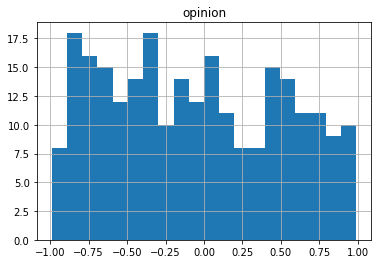

In [30]:
normalize_opinions(init_net)
set_similarity(init_net, metric=SIMILARITY_OP_METRIC)
show_hist_attribute(init_net, 'opinion')
print()


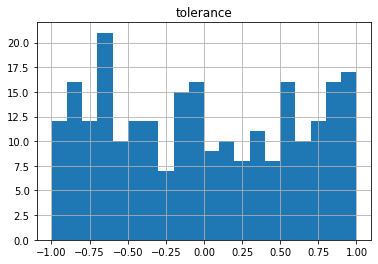

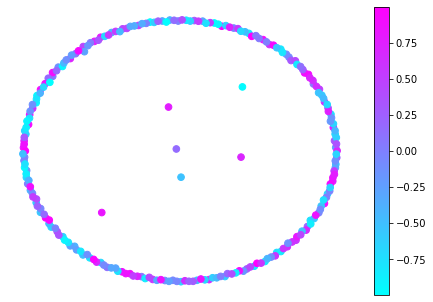

In [31]:
show_hist_attribute(init_net, 'tolerance')
draw_graph(init_net, node_color_attribute='tolerance')

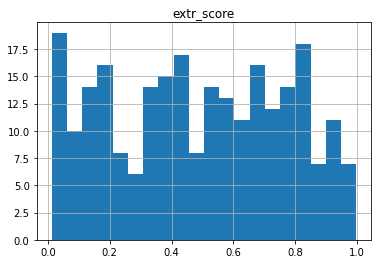

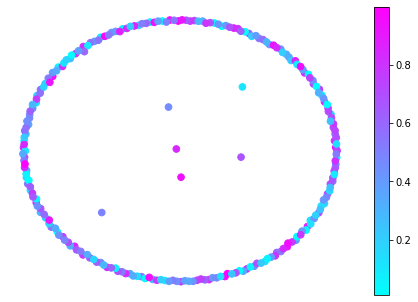

In [32]:
show_hist_attribute(init_net, 'extr_score')
draw_graph(init_net, node_color_attribute='extr_score')

In [33]:
show_hist_attribute(init_net, 'similarity', at='edges')
print()

  no  edges  in this graph



In [34]:
show_hist_attribute(init_net, 'weight', at='edges')
print()

  no  edges  in this graph



In [35]:
def decay_weights(graph, decay, remove_trashold=0):
    removed_counter=0
    for edge in graph.edges():
        graph.edges[edge]['weight']-=decay
        if graph.edges[edge]['weight']<=remove_trashold:
            graph.remove_edge(*edge)
            removed_counter+=1
    return removed_counter


In [36]:
def get_walk_matrix(graph, order=WALK_ORDER, iter_weight_sum=ITER_WEIGHT_SUM ):
    adj_matr=copy.deepcopy(nx.adjacency_matrix(graph))
    walk_matrix=(adj_matr**order).toarray()
    if iter_weight_sum:
        for n in range(1,order):
            walk_matrix+=(adj_matr**n).toarray()       
    return walk_matrix

In [37]:
display_settings()    

--------------------------------------------------------------------------- settings inizializzazione grafo
N_AGENTS: 250
GRAPH_INIT: empty
--------------------------------------------------------------------------- settings opinioni
N_OPINIONS: 1
OPINION_INIT_METHOD: uniform
OPINION_NORM_METHOD: bound
--------------------------------------------------------------------------- settings tolleranza
TOLL: uniform
TOLL_INF: -1
TOLL_SUP: 1
--------------------------------------------------------------------------- settings suscettibilità
SUSCEPT: 0.1
--------------------------------------------------------------------------- settings similarità d'opinione
SIMILARITY_OP_METRIC: nrm_L1
--------------------------------------------------------------------------- settings generali di evoluzione
N_STEPS: 250
EVO_NET: True
INTERACTION_MINPROBA: 0.3
WALK_ORDER: 2
ITER_WEIGHT_SUM: True
--------------------------------------------------------------------------- settings scelta del nodo interagente
NE

In [38]:
import time
import random as rnd
from IPython.display import clear_output


def Generate_Commnet(comm_net,N_STEPS=N_STEPS, verbose=1, deepcopy=True, iter_clearout=True,reset_pos=True, 
                     LAYOUT_STEP=LAYOUT_STEP, STEP_VIS=STEP_VIS, METRIC_STEP=METRIC_STEP,
                     WEIGHT_DECAY=WEIGHT_DECAY, PREFERENTIAL_ATTACHMENT_BASE_EXPONENT=PREFERENTIAL_ATTACHMENT_BASE_EXPONENT,
                     NEWIRE_EXP_DEG=NEWIRE_EXP_DEG, RND_NEIGH_SIM_PROPORTION_VALUE=RND_NEIGH_SIM_PROPORTION_VALUE,
                     fast_run=False, just_showgraph=False, fast_vis=False
                    ):

    # ------------------------------------------------------- se richiesto lavora su una nuova copia, altrimenti modifica il grafo inline
    if deepcopy:
        comm_net=copy.deepcopy(comm_net)
   
        
    # ------------------------------------------------------- modalità per testare iperparametri
    if fast_run:
        verbose=1
        just_showgraph=False
        iter_clearout=False
        LAYOUT_MODE='none'
        reset_pos=False        
    # ------------------------------------------------------- modalità graficamente più leggera per visualizzare iterativamente metriche e grafi
    if just_showgraph:
        verbose=1
        fast_run=False
        iter_clearout=True
        LAYOUT_MODE='previous'
        reset_pos=True
    # ------------------------------------------------------- modalità per testare iperparametri E visualizzare i grafi finali
    if fast_vis:
        verbose=1
        just_showgraph=True
        iter_clearout=False
        LAYOUT_MODE='fixed'
        reset_pos=True
        LAYOUT_FIXED_POS_SET_AT_STEP=N_STEPS
#         LAYOUT_ITER,
        STEP_VIS=N_STEPS
        METRIC_STEP=int(N_STEPS/10)
        
         
    # ------------------------------------------------------- per semplicità nel programma c'è un'unica variabile che tiene memoria delle posizioni
    global LAYOUT_POS
    if reset_pos:
        LAYOUT_POS= nx.spring_layout(comm_net,  iterations=N_AGENTS*2)
        
    len_progressbar=50

    # ------------------------------------------------------- inizializzazione metriche
    Edges={
        'tot':{0:0},
        'new':{0:0},
        'new_s':{0:0},
        'new_r':{0:0},
        'removed':{0:0}
    }

    Degree={
        'max':{0:0},
#         'avg':{0:0}
    }

    Graph={
        'diameter':{},
        'avg_path_length':{},
        'n_connected_subgraphs':{},
        'size_biggest_component':{},
        'transitivity':{0:0},
        'avg_sim':{0:0},
        'DOC_modularity':{0:0},
        'N_assortativity':{0:0},
#         'Opn_assortativity':{0:0},
#         'Tol_assortativity':{0:0}
        'Degree_Pearson':{0:0}

    }

    Nodes_avg={
    #     'centrality':
        'clustering': {0:0}
    }

    # Nodes_all={
    #     'centrality':
    #     'clustering':
    # }

    Time={0:0}

    tot_interaction_matrix=np.zeros(shape=(N_AGENTS,N_AGENTS))
    
    for step in range(N_STEPS):
        
        if iter_clearout:
            if not just_showgraph:
                clear_output(wait=True)
        pos_iter_counter=0
        
        #---------------------------------------------------- inizializzazione metriche-step
        start_time=time.time()

        wire_counter={
            "newire":0,
            "first_n":0,
            "second_n":0,
            "added":0,
            "added_second_n":0,
            "added_newire":0,
            "removed":0
        }   #ridefinito ad ogni step
        
        step_interaction_matrix=np.zeros(shape=(N_AGENTS,N_AGENTS))
        int_value_array=[]
        new_op_matrix=[]

        #--------------------------------------weight decay
        if EVO_NET and WEIGHT_DECAY!=0.0:
            wire_counter['removed']=decay_weights(comm_net, WEIGHT_DECAY)

        #--------------------------------------matrice di "walk" (NB dopo il decay) 
        walk_matrix=copy.deepcopy(get_walk_matrix(comm_net))
        
        #--------------------------------------grado dei nodi
        nodes_degree=copy.deepcopy(comm_net.degree())

        for node_1 in comm_net.nodes():
#             print(nodes_degree)
            #---------------------------------------------------------------------- calcolo degree del nodo (ordine WALK_ORDER)
            contact_array=walk_matrix[node_1]
            contact_array[node_1]=0.    #elimino self_loop
            deg_ord=(contact_array != 0).sum()
            
            #---------------------------------------------------------------------- scelta se in questo timestamp il nodo_1 avrà un'interazione
            prb_intr=comm_net.nodes[node_1]['interaction_proba']

            prb_intr+=(1-prb_intr)/(1+deg_ord)   
            #aggiunge alla probabilità di interazione una quantità inversamente proporzionale al deg_ord
            #se il nodo è isolato, sarà certo che avrà un'interazione
            rnd_intr=np.random.uniform(0,1)
            if prb_intr < rnd_intr:
                new_op_matrix.append(comm_net.nodes[node_1]['opinion'])
                continue

            #---------------------------------------------------------------------- scelta del nodo_2 con cui interagirà


            newire_prob=1./(1+deg_ord**NEWIRE_EXP_DEG)
            rnd_newire=np.random.uniform(0,1)
            flag_newire=False
            if (NEWIRE=='all' and rnd_newire<=newire_prob and deg_ord<N_AGENTS-1) or (NEWIRE=='isolated' and deg_ord==0) :
                choice_group=np.array([(n,1.) for n, val in enumerate(contact_array) if val==0 and n!=node_1])
                flag_newire=True
            elif NEWIRE=='none' and deg_ord==0: 
                new_op_matrix.append(comm_net.nodes[node_1]['opinion'])
                continue
            else:
                if RND_NEIGH=='uniform':
                    choice_group=np.array([(n,1.) for n, val in enumerate(contact_array) if val>0])
                elif RND_NEIGH=='weighted':
                    choice_group=np.array([(n,val) for n, val in enumerate(contact_array) if val>0])

            if RND_NEIGH_SIM_PROPORTION:
                op_1=comm_net.nodes[node_1]['opinion']
                for k, (c_node, _) in enumerate(choice_group):
                    c_op_2=comm_net.nodes[c_node]['opinion']
                    c_similarity=op_sim(op_1,c_op_2)
                    choice_group[k,1]+=choice_group[k,1]*(c_similarity+1)*RND_NEIGH_SIM_PROPORTION_VALUE

            if PREFERENTIAL_ATTACHMENT:
                pref_att_exp=PREFERENTIAL_ATTACHMENT_BASE_EXPONENT
                if PREFERENTIAL_ATTACHMENT_TOLL_PROPORTION:
                    pref_att_exp*=(comm_net.nodes[node_1]['tolerance']+1)
                for k, (c_node, _) in enumerate(choice_group):
                    c_node_degree=nodes_degree[c_node]
                    if c_node_degree==0:
                        c_node_degree=1
                    choice_group[k,1]*=(c_node_degree**pref_att_exp)


            cum_value=0
            cum_array=[]
            for node, val in choice_group:
                cum_value+=val
                cum_array.append((node,cum_value))
            cum_array=np.array(cum_array)

            rnd_neigh_value=np.random.uniform(0, cum_array[:,1].max())
            for node_2, node_val in cum_array:
                if rnd_neigh_value<=node_val:
                    break     #nodo_2 è stato scelto qui

            step_interaction_matrix[int(node_1)][int(node_2)]+=1

            flag_interaction='unk'        
            if node_2 in neigh_list(comm_net, node_1, order=1):
                wire_counter['first_n']+=1
                flag_interaction='first_n'
            elif flag_newire==False:
                wire_counter['second_n']+=1
                flag_interaction='second_n'
            else:
                wire_counter['newire']+=1
                flag_interaction='newire'   
            assert flag_interaction!='unk'

            #---------------------------------------------------------------------- interazione delle loro opinioni
            op_1=comm_net.nodes[node_1]['opinion']
            op_2=comm_net.nodes[node_2]['opinion']

            similarity=op_sim(op_1,op_2)

            op_diff=op_2-op_1
            old_op=op_1        
            if SIM_PROPORTION:
                SIM=similarity
            else:
                SIM=np.sign(similarity)         
            TOL=comm_net.nodes[node_1]['tolerance']*TOLL_REPROP
            SUS=comm_net.nodes[node_1]['suscept']
            STC=STC_DISTR(STC_PAR1,STC_PAR2)
            INTERACTION_PROPORTION=SIM_NORM(SIM+TOL+STC)
            new_op=old_op+op_diff*INTERACTION_PROPORTION*SUS

            int_value_array.append(INTERACTION_PROPORTION)

    #         if (op_1 != op_2).any():
    #             assert (new_op != old_op).any()      
            new_op_matrix.append(new_op)

        # ------------------------------------------------------------------------ setting new attribute values   
            # weight è settato ad ogni iterazione sull node_1, gli altri sono settati a fine iterazione
            # non ho rilevato problemi evidenti di leakeage
            #---------------------------------------------------------------------- modifica del peso di connessione
            if EVO_NET:
                wir=set_this_weight(comm_net, node_1, node_2, interaction_value=INTERACTION_PROPORTION)
                if wir==-1:
                    wire_counter['removed']+=1
                    assert flag_interaction=='first_n'
                elif wir==1:
                    wire_counter['added']+=1
                    assert flag_interaction!= 'first_n'
                    if flag_interaction=='second_n':
                        wire_counter['added_second_n']+=1
                    elif flag_interaction=='newire':
                        wire_counter['added_newire']+=1
                    else:
                        print(" ERROR undetermined wiring with node", node_1)

        #set all opinions 
        new_op_matrix=np.array(new_op_matrix)
        assert new_op_matrix.shape==(N_AGENTS,N_OPINIONS)
        for n, op in enumerate(new_op_matrix):
            comm_net.nodes[n]['opinion']=op    
            #NB questa strategia di update di opinioni è rischiosa al livello di codice (da implementare update da dizionario nodo:new_op)
        normalize_opinions(comm_net)
        #re-evaluate all extr_score
        set_extr_score(comm_net) 
        #re-evaluate all similarities
        set_similarity(comm_net)
        #set DOC
        set_DOC(comm_net)
        
        
        # ------------------------------------------------------------------------ calcolo di tutte le metriche-step
        #nessuna delle seguenti viene usata nell'algoritmo di generazione
        #le prime due sonocalcolate con condizioni diverse perché fanno parte del grafico eventualmente visualizzato durante la generazione
        #keeps memory of clustering values
        if TOPPROP_WEIGHTED:
            tp_w='weight'
        else:
            tp_w=None
        if step+1==N_STEPS or ((verbose>=3 or just_showgraph) and ((step+1)%STEP_VIS==0)) or (not fast_vis and step==0) or step%METRIC_STEP==0:
            clustering_dict=set_topprop(comm_net, lambda g: nx.clustering(g, weight=tp_w), 'clustering')   
        #keeps memory of betweenness values
        if step+1==N_STEPS or ((verbose>=3 or just_showgraph) and ((step+1)%STEP_VIS==0)) or (not fast_vis and step==0):       
            set_topprop(comm_net, lambda g: nx.betweenness_centrality(g, weight=tp_w), 'betweenness', get=None)
            set_topprop(comm_net, lambda g: nx.closeness_centrality(g, wf_improved=True), 'closeness', get=None)

        if step+1==N_STEPS or step%METRIC_STEP==0:
            Edges['tot'][step+1]=len(comm_net.edges())
            Edges['new'][step+1]=wire_counter['added']
            Edges['new_s'][step+1]=wire_counter['added_second_n']
            Edges['new_r'][step+1]=wire_counter['added_newire']
            Edges['removed'][step+1]=wire_counter['removed']

            connected_components=sorted(nx.connected_components(comm_net), key=len, reverse=True)
            Graph['n_connected_subgraphs'][step+1]=len(connected_components)
            Graph['size_biggest_component'][step+1]=len(connected_components[0])
            Graph['diameter'][step+1]=nx.diameter(comm_net.subgraph(connected_components[0]))
            Graph['avg_path_length'][step+1]=nx.average_shortest_path_length(comm_net.subgraph(connected_components[0]))
            Graph['transitivity'][step+1]=nx.transitivity(comm_net)
            Graph['avg_sim'][step+1]=get_avg_attribute(comm_net, 'similarity', at='edges')
            DOC_partition=get_graph_partition(comm_net, 'DOC')
            Graph['DOC_modularity'][step+1]=modularity(comm_net, DOC_partition)
            Graph['N_assortativity'][step+1]=nx.numeric_assortativity_coefficient(comm_net, 'DOC')
#             set_DOC(comm_net, N_BINS=N_AGENTS*2)
#             Graph['Opn_assortativity'][step+1]=nx.attribute_assortativity_coefficient(comm_net, 'DOC')
#             Graph['Tol_assortativity'][step+1]=nx.attribute_assortativity_coefficient(comm_net, 'tolerance')
            Graph['Degree_Pearson'][step+1]=nx.degree_pearson_correlation_coefficient(comm_net)
 
            
            Degree['max'][step+1]=get_max_degree(comm_net)

            Nodes_avg['clustering'][step+1]=dictoarr(clustering_dict).mean()

        tot_interaction_matrix+=step_interaction_matrix
        
        # ---------------------------------------------------------------------- calcolo layout del grafo
        if LAYOUT_MODE=='fixed':
            if LAYOUT_FIXED_POS_SET_AT_STEP==step+1:
                LAYOUT_POS=nx.spring_layout(comm_net, 
                                                scale=LAYOUT_SCALE, k=LAYOUT_OPT_DIST, iterations=LAYOUT_FIXED_ITER, weight='weight')
        elif LAYOUT_MODE=='previous':
            if step%LAYOUT_STEP or step+1==N_STEPS:
                if step+1==N_STEPS and pos_iter_counter==0:
                    required_iter=LAYOUT_FIXED_ITER
                else:
                    required_iter=LAYOUT_ITER
                pos_iter_counter+=required_iter
                LAYOUT_POS=nx.spring_layout(comm_net, pos=LAYOUT_POS,
                                            scale=LAYOUT_SCALE, k=LAYOUT_OPT_DIST, iterations=required_iter, weight='weight')
                    #il layout viene aggiornato iterativamente partendo dalle posizioni precedenti
                    #draw_graph usa queste posizioni, prese da parametri globali (non c'è bisogno di passarle)  


        #  ---------------------------------------------------------------------- VISUALIZZAZIONE           
        if verbose>=2:
            print("\n\n")    
            print("-"*100, "   Iteration", step+1, "metrics")
        # ------------------------------------------------------------------------ drawing graph (every STEP_VIS steps)
        if ((verbose>=3 or just_showgraph) and ((step+1)%STEP_VIS==0 or step+1==N_STEPS)) or ((verbose>=2)  and step+1==N_STEPS) or (not fast_vis and step==0):
            if just_showgraph and not fast_vis:
                clear_output(wait=True)
            plt.figure(figsize=(25,int(LAYOUT_PLOTS[0]*5)))
            
            # ------------------------------------------------------------------------ drawing graph
            plt.subplot(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],(1,7))           
            if N_OPINIONS==1:
                draw_graph(comm_net, trashold=WEIGHT_TRASHOLD, node_color_attribute='opinion', node_cmap=TERNARY_CMAP, show=False)
            else:
                draw_graph(comm_net, trashold=WEIGHT_TRASHOLD, node_color_attribute='extr_score', node_cmap=BINARY_CMAP, show=False)
            
            show_hist_attribute(comm_net, 'opinion', hist_steps=100, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],3))
            show_hist_attribute(comm_net, 'extr_score', hist_steps=100, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],4))
            show_attribute_matrix(comm_net, ['tolerance', 'opinion'], bins=25, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],5))            
            show_hist_attribute(comm_net, 'similarity', at='edges', hist_steps=100, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],8))
            show_hist_attribute(comm_net, 'weight', at='edges', hist_steps=100, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],9))
            # ------------------------------------------------------------------------ visualizing interaction values 
            plt.subplot(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],10)
            int_value_array=np.array(int_value_array).reshape(-1,N_OPINIONS)
            int_histo_data=[]
            for d in range(N_OPINIONS):
        #             print(d)
                int_histo_data.append(make_hist_dict(int_value_array[:,d], hist_steps=20) )
                plt.bar(list(int_histo_data[d][0].keys()), list(int_histo_data[d][0].values()), alpha=0.2, width=-int_histo_data[d][1], align='edge')
                plt.title("interaction values")
                plt.grid()

            # ------------------------------------------------------------------------ visualizing degree/edges info
            plot_fd(Edges, 'tot', title="Tot Edges", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],11))
            deg_dist(comm_net, scale='log', plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],12))
            plot_fd(Degree, 'max', title="Max Degree", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],13) )
            max_degree=get_max_degree(comm_net)
            show_edge_matrix(comm_net, 'tolerance', normed=True, scale=None,  plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],14))
            show_attribute_matrix(comm_net, ['tolerance', 'degree'], bins=max_degree, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],15))
            
            # ------------------------------------------------------------------------ visualizing centrality info
            show_hist_attribute(comm_net, 'closeness', hist_steps=100, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],16))
            show_attribute_matrix(comm_net, ['tolerance', 'closeness'], bins=25, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],17))           
            show_hist_attribute(comm_net, 'betweenness', hist_steps=100, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],21))
            show_attribute_matrix(comm_net, ['tolerance', 'betweenness'], bins=25, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],22))
#             set_topprop(comm_net, lambda g: nx.eigenvector_centrality(g, max_iter=1000), 'eigen_centr', get=None)
#             show_hist_attribute(comm_net, 'eigen_centr', hist_steps=100, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],31))
#             show_attribute_matrix(comm_net, ['tolerance', 'eigen_centr'], bins=25, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],32))             
            
            # ------------------------------------------------------------------------ visualizing connected components info
            plt.subplot(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],20)    
            plot_fd(Graph, attribute='n_connected_subgraphs', show=False)
            plot_fd(Graph, attribute='size_biggest_component', show=False, color='r')
            plt.legend()
            plt.grid()
            plt.title(" Connected Components:")
            plot_fd(Graph, attribute='diameter', title="Giant Component Diameter", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],25))
            plot_fd(Graph, attribute='avg_path_length', title="Giant Component average distance", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],30))
            
            # ------------------------------------------------------------------------ visualizing edges correlations
            show_edge_matrix(comm_net, 'opinion', normed=True, scale=None, bins=50, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],(18,24)))
            
            # ------------------------------------------------------------------------ visualizing clustering info
            show_hist_attribute(comm_net, 'clustering', hist_steps=100, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],26))
            show_attribute_matrix(comm_net, ['tolerance', 'clustering'], bins=25, plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],27))
            plot_fd(Nodes_avg, attribute='clustering', title='Avg Nodes Clustering', plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],28))
            plot_fd(Graph, attribute='transitivity', title="Graph Transitivity", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],29))
            
            # ------------------------------------------------------------------------ visualizing assortativity info
            plot_fd(Graph, attribute='avg_sim', title="Average similarity ("+SIMILARITY_OP_METRIC+")", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],31))            
            plot_fd(Graph, attribute='DOC_modularity', title="Modularity (partitions of "+str(OPINION_DISCR_BINS)+"-bins DOC)", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],32))            
            plot_fd(Graph, attribute='N_assortativity', title="Assortativity ("+str(OPINION_DISCR_BINS)+"-bins DOC enumerative Newman)", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],33) )
#             plot_fd(Graph, attribute='Opn_assortativity', title="Assortativity (by scalar attribute Opinion)", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],34) )
#             plot_fd(Graph, attribute='Tol_assortativity', title="Assortativity (by scalar attribute Tolerance)", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],35) )
            show_edge_matrix(comm_net, 'degree', normed=True, scale=None,  plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],34))   #si potrbbe implementare per attributi diversi
            plot_fd(Graph, attribute='Degree_Pearson', title="Pearson Coeff. of Degree correlation ", plot_layout=(LAYOUT_PLOTS[0],LAYOUT_PLOTS[1],35) )

        
            plt.show()


        Time[step+1]=time.time()-start_time
                  
        if verbose>=2:          
            # ------------------------------------------------------------------------ visualizing general info  (every step)
            print("       Required time: ")
            print("           iter. time=", Time[step+1], "     time/edges=", Time[step+1]/len(comm_net.edges()))
            print("       Interaction counter info: ")
            print("           newire interactions=",wire_counter['newire'],"   first_n interactions=:", wire_counter['first_n'],"     second_n interactions=:", wire_counter['second_n'])
            print("       Wiring counter info:")
            print("           tot edges=",len(comm_net.edges()),"   added connections=:", wire_counter['added'],end='')
            print("  (", wire_counter['added_second_n']," second_n, ", wire_counter['added_newire']," newire )", "    removed_connections=:", wire_counter['removed'])
            print("")
            
        
        if verbose==1 or (iter_clearout and verbose >=1):
            perc_compl=(step+1)/N_STEPS
            int_perc_compl=np.floor(len_progressbar*perc_compl).astype(int)
#             wip=1
#             if step+1==N_STEPS:
#                 wip=0
            print("    ["+"="*int_perc_compl+">"+"-"*(len_progressbar-int_perc_compl-1)+"]     ", end='')
            print(" completed step {:4d} of {:4d}      ".format(step+1, N_STEPS), end='')
            print(" (Total time: {:4.2f} s; ext. remaining time: {:4.2f} s) ".format( dictoarr(Time).sum(), dictoarr(Time)[-LAYOUT_STEP:].mean()*(N_STEPS-step) ), end='\r' )
            if step+1>=N_STEPS-1:
                print("\r"+" "*300)
                
    if verbose==1 or (iter_clearout and verbose >=1):
        print("\r    ["+"="*len_progressbar+"]     ", end='')
        print(" generation completed;", end='')
        print(" Total time: {:.2f} s; avg time/step: {:.2f} s ".format( dictoarr(Time).sum(), dictoarr(Time).sum()/N_STEPS ), end='\n' )      
    
    Metrics={
        'Edges':Edges,
        'Degree':Degree,
        'Graph':Graph,
        'Nodes_avg':Nodes_avg,
        'Time':Time
    }

    return comm_net, Metrics, tot_interaction_matrix


In [39]:
display_settings()

--------------------------------------------------------------------------- settings inizializzazione grafo
N_AGENTS: 250
GRAPH_INIT: empty
--------------------------------------------------------------------------- settings opinioni
N_OPINIONS: 1
OPINION_INIT_METHOD: uniform
OPINION_NORM_METHOD: bound
--------------------------------------------------------------------------- settings tolleranza
TOLL: uniform
TOLL_INF: -1
TOLL_SUP: 1
--------------------------------------------------------------------------- settings suscettibilità
SUSCEPT: 0.1
--------------------------------------------------------------------------- settings similarità d'opinione
SIMILARITY_OP_METRIC: nrm_L1
--------------------------------------------------------------------------- settings generali di evoluzione
N_STEPS: 250
EVO_NET: True
INTERACTION_MINPROBA: 0.3
WALK_ORDER: 2
ITER_WEIGHT_SUM: True
--------------------------------------------------------------------------- settings scelta del nodo interagente
NE

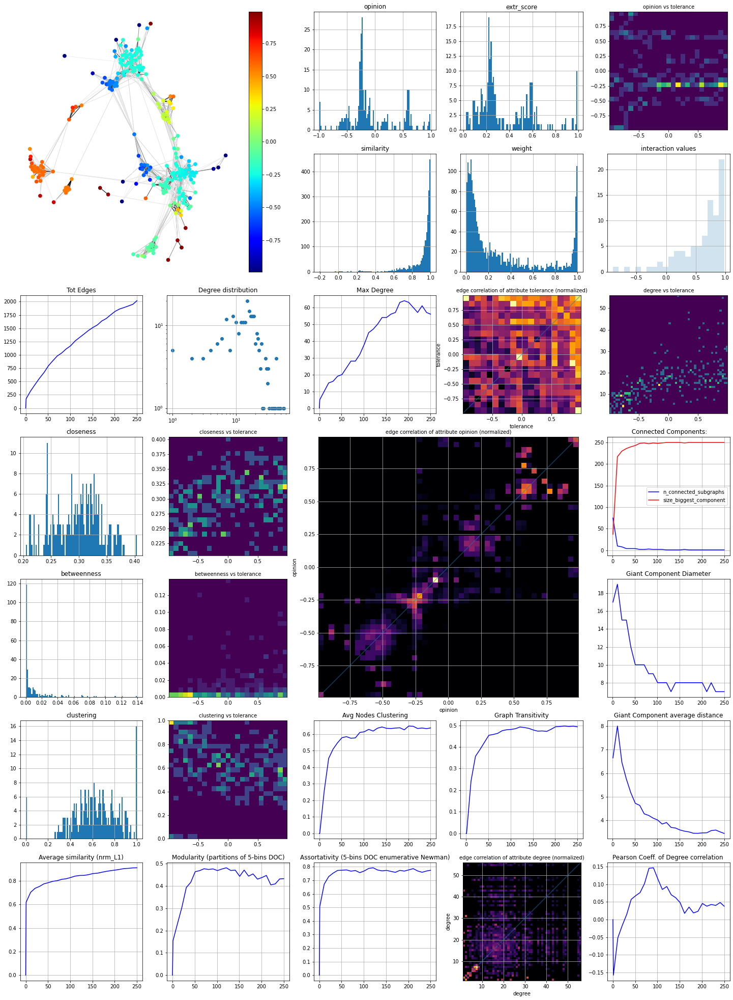

                                                                                                                                                                                                                                                                                                            
    [==================================================]      generation completed; Total time: 225.48 s; avg time/step: 0.90 s 


In [40]:
comm_net, Metrics, interaction_matrix= Generate_Commnet(init_net,just_showgraph=True)

Confronto con grafo di partenza

In [41]:
# print("#"*60,"Initial graph attributes distribution")
# show_hist_attribute(init_net, 'opinion', hist_steps=100)
# show_hist_attribute(init_net, 'extr_score', hist_steps=100)
# show_hist_attribute(init_net, 'similarity', at='edges', hist_steps=100)
# show_hist_attribute(init_net, 'weight', at='edges', hist_steps=100)
# if N_OPINIONS==1:
#     draw_graph(init_net, trashold=WEIGHT_TRASHOLD, node_color_attribute='opinion', node_cmap=TERNARY_CMAP)
# else:
#     draw_graph(init_net, trashold=WEIGHT_TRASHOLD, node_color_attribute='extr_score', node_cmap=BINARY_CMAP)
# deg_dist(init_net, display=True)

# print("#"*60,"results after ", N_STEPS,"steps: attributes distribution")
# show_hist_attribute(comm_net, 'opinion', hist_steps=100)
# show_hist_attribute(comm_net, 'extr_score', hist_steps=100)
# show_hist_attribute(comm_net, 'similarity', at='edges', hist_steps=100)
# show_hist_attribute(comm_net, 'weight', at='edges', hist_steps=100)
# if N_OPINIONS==1:
#     draw_graph(comm_net, trashold=WEIGHT_TRASHOLD, node_color_attribute='opinion', node_cmap=TERNARY_CMAP)
# else:
#     draw_graph(comm_net, trashold=WEIGHT_TRASHOLD, node_color_attribute='extr_score', node_cmap=BINARY_CMAP)
# deg_dist(comm_net, display=True, scale='log')
# print()

Per una diversa visualizzazione del grafo

   graph containing  250  nodes and  2018  edges
    weight  trashold is set to  0.0
   node color based on attribute  DOC


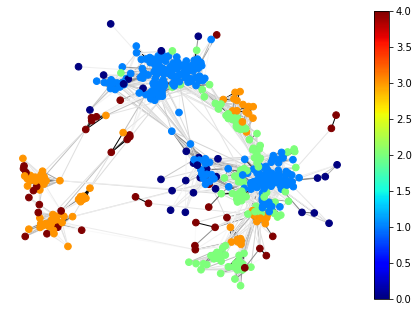

0.33144540173399867

In [42]:
T_LAYOUT_ITER=200
T_LAYOUT_SCALE=1
T_LAYOUT_EXP=0.2  #più è grande, minore sarà la k (optimal distance) di spring layout
T_LAYOUT_OPT_DIST=1/(N_AGENTS**T_LAYOUT_EXP)
T_WEIGHT_TRASHOLD=0.0
t_pos=nx.spring_layout(comm_net, iterations=T_LAYOUT_ITER, weight='weight', scale=T_LAYOUT_SCALE, k=T_LAYOUT_OPT_DIST)
draw_graph(comm_net, trashold=T_WEIGHT_TRASHOLD, node_color_attribute='DOC', node_cmap=TERNARY_CMAP, pos=t_pos, tellinfo=True)
T_LAYOUT_OPT_DIST

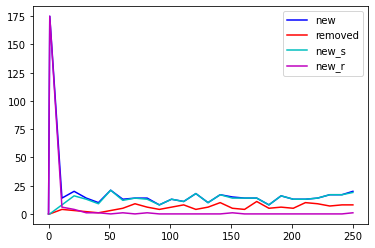

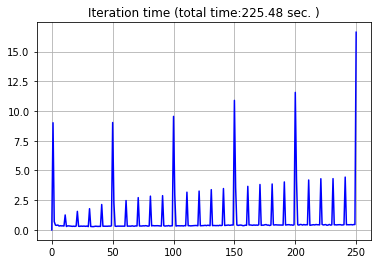

In [43]:
# plot_fd(Metrics, subdict='Edges', attribute='tot', title="Tot Edges")

plot_fd(Metrics, subdict='Edges', attribute='new', color='b', show=False)
plot_fd(Metrics, subdict='Edges', attribute='removed', color='r', show=False)
plot_fd(Metrics, subdict='Edges', attribute='new_s', color='c', show=False)
plot_fd(Metrics, subdict='Edges', attribute='new_r', color='m', show=False)
plt.legend()
plt.title("")
plt.show()

# plot_fd(Metrics, subdict='Graph', attribute='n_connected_subgraphs', show=False)
# plot_fd(Metrics, subdict='Graph', attribute='size_biggest_component', show=False, color='r')
# plt.legend()
# plt.title("")
# plt.show()

# plot_fd(Metrics, subdict='Graph', attribute='diameter', title="Biggest Subgraph Diameter")

# plot_fd(Metrics, subdict='Nodes_avg', attribute='clustering', title='avg nodes clustering')

plot_fd(Metrics, subdict='Time', title="Iteration time (total time:{:.2f} sec. )".format(dictoarr(Metrics['Time']).sum()))

# Metrics

In [44]:
connected_components=sorted(nx.connected_components(comm_net), key=len, reverse=True)
sizes_con_comp=[len(comp) for comp in connected_components]
sizes_con_comp

[250]

In [45]:

# try:
#     for ops in np.array(op_matrix).T:
#         plt.plot(dictoarr(ops, 'keys'), dictoarr(ops))
#         plt.show()
# except:
#     print()
    

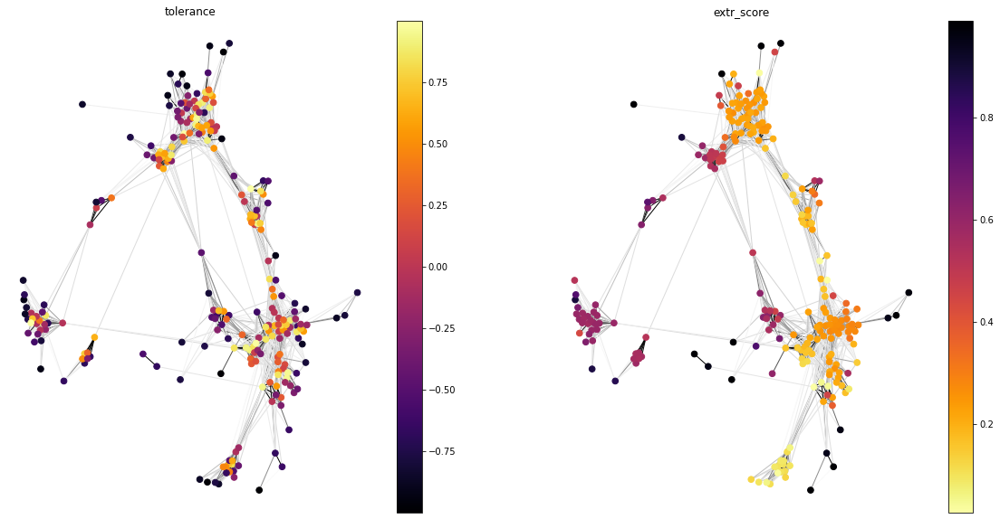

In [46]:
def show_tollextr_graphcorr(graph):
    plt.figure(figsize=(20,10))
    plt.subplot(1,2,1)
    plt.title("tolerance")
    draw_graph(graph, node_color_attribute='tolerance', node_cmap='inferno', show=False)
    plt.subplot(1,2,2)
    plt.title("extr_score")
    draw_graph(graph, node_color_attribute='extr_score', node_cmap='inferno_r', show=False)
    # plt.colorbar(gr)
    plt.show()
    
show_tollextr_graphcorr(comm_net)

In [47]:

# max_degree=get_max_degree(comm_net)  
# plt.figure(figsize=(14,14))
# T_BINS=20
# show_attribute_matrix(comm_net, ['tolerance', 'opinion'], bins=T_BINS, plot_layout=(2,2,1))

# show_attribute_matrix(comm_net, ['tolerance', 'extr_score'], bins=T_BINS, plot_layout=(2,2,2))

# show_attribute_matrix(comm_net, ['extr_score', 'degree'], bins=max_degree, plot_layout=(2,2,3))

# show_attribute_matrix(comm_net, ['tolerance', 'degree'], bins=max_degree, plot_layout=(2,2,4))




In [48]:
# T_BINS=50
# VIS_SCALE=np.log10
# plt.figure(figsize=(20,7))

# show_edge_matrix(comm_net, 'opinion', cmap='cool', scale=VIS_SCALE, bins=T_BINS, plot_layout=(1,3,1))

# show_edge_matrix(comm_net, 'tolerance', cmap='cool', scale=VIS_SCALE, bins=T_BINS, plot_layout=(1,3,2))

# show_edge_matrix(comm_net, 'extr_score', cmap='cool', scale=VIS_SCALE, bins=T_BINS, plot_layout=(1,3,3))

In [49]:
# plt.figure(figsize=(16,16))
# T_BINS=30

# show_attribute_matrix(comm_net, ['tolerance', 'betweenness'], bins=T_BINS, plot_layout=(2,2,1))

# show_attribute_matrix(comm_net, ['opinion', 'betweenness'], bins=T_BINS, plot_layout=(2,2,2))

# show_attribute_matrix(comm_net, ['tolerance', 'clustering'], bins=T_BINS, plot_layout=(2,2,3))

# show_attribute_matrix(comm_net, ['opinion', 'clustering'], bins=T_BINS, plot_layout=(2,2,4))

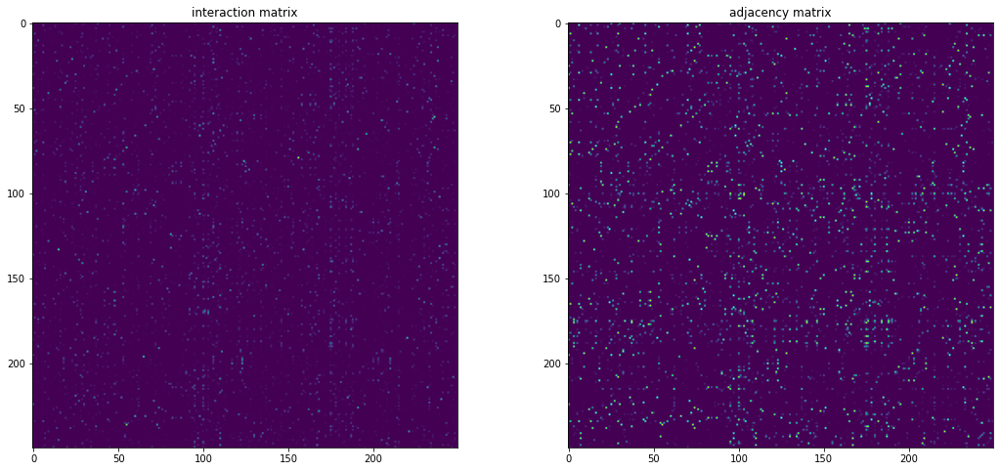

In [50]:
# from scipy.linalg import svd

def show_inter_adj_matrix(graph, interaction_matrix):
    plt.figure(figsize=(18,8))

    plt.subplot(1,2,1)
    plt.title("interaction matrix")
    plt.imshow(interaction_matrix)


    # block_interaction_matrix=svd(tot_interaction_matrix)
    # plt.figure(figsize=(8,8))
    # plt.title("BLOCK-DIAGONALIZED interaction matrix")
    # # plt.imshow(block_interaction_matrix[2])
    # plt.show()

    plt.subplot(1,2,2)
    adj_matrix=nx.adjacency_matrix(graph)
    plt.title("adjacency matrix")
    plt.imshow(adj_matrix.toarray())
    plt.show()

    
show_inter_adj_matrix(comm_net, interaction_matrix)

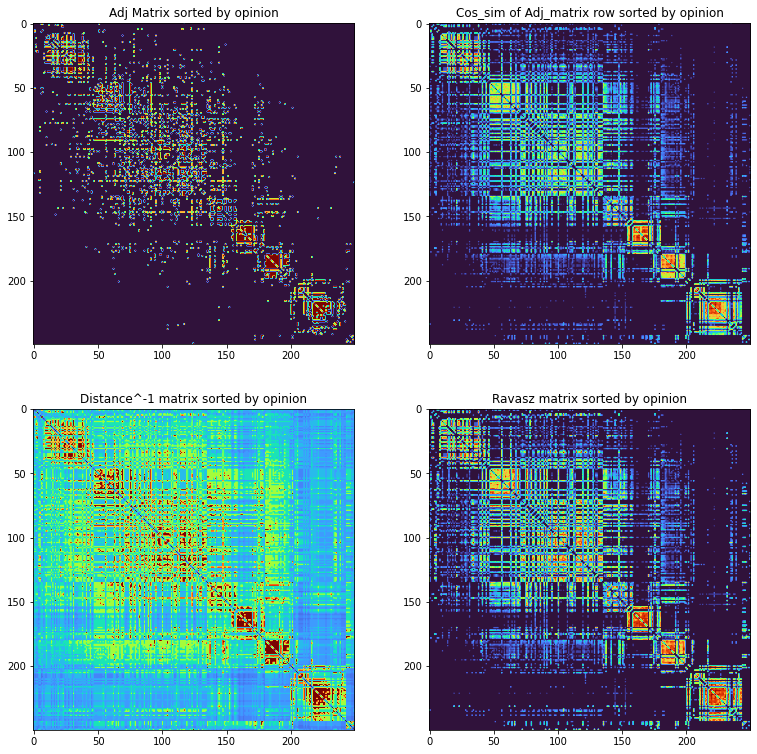

In [51]:
def get_comparison_matrix(graph, comp_f, sort_by_attribute=None,
                          nodedata_f=lambda g: nx.adjacency_matrix(g, weight=None).toarray(), simm_g=True):
#comp_f è la funzione usata per ottenere il valore dell'emelento di matrice di comparison [i][j]
     #riceve info in formato node_data che deve essere hashable con gli id dei nodi
#nodedata_f è la funzione usata per ottenere questo hashable


    if sort_by_attribute!=None:
        srt_g_n=sorted(graph.nodes(), key=lambda x: graph.nodes[x][sort_by_attribute])
    else:
        srt_g_n=graph.nodes()
#     print(srt_g_n)
    N_AG=len(srt_g_n)
    node_data=nodedata_f(graph)
    
    comp_matrix=np.zeros( shape=(N_AG,N_AG) )
    for i, node_1 in enumerate(srt_g_n):
#         print(node_1, graph.nodes[node_1][sort_by_attribute])
#         comp_matrix.append([])
        for j, node_2 in enumerate(srt_g_n):
            if simm_g and j<=i:
                continue

            cmp_val=comp_f(node_data, node_1, node_2) #per velocità
            comp_matrix[i][j]=cmp_val   
            if simm_g:
                comp_matrix[j][i]=cmp_val
                
#             break
#         break
#         test_run
    
    return comp_matrix
    
    
                         
def conn_cossim(g_m, n_1, n_2):
    return cos_sim( g_m[n_1], g_m[n_2])

def distance(nd, n_1, n_2):
    if n_1 in nd:
        if n_2 in nd[n_1]:
            d=nd[n_1][n_2]
            return 1/d
    return 0

# def diff_count(g_m, n_1, n_2):


plt.figure(figsize=(13,13))
plt.subplot(2,2,1)
plt.title("Adj Matrix sorted by opinion")
mtr_adj=get_comparison_matrix(comm_net, lambda g,n_1,n_2: g[n_1][n_2], sort_by_attribute='opinion')
plt.imshow(mtr_adj, cmap='turbo')
# plt.show()
   
plt.subplot(2,2,2)
plt.title("Cos_sim of Adj_matrix row sorted by opinion")
mtr_cos=get_comparison_matrix(comm_net, conn_cossim, sort_by_attribute='opinion')
plt.imshow(mtr_cos, cmap='turbo')
# plt.axis('off')

# def distance(g, n_1, n_2):
#     return nx.all_pairs_shortest_path_length(g)[n_1][n_2]

# plt.figure(figsize=(20,9))
plt.subplot(2,2,3)
plt.title("Distance^-1 matrix sorted by opinion")
mtr_dst=get_comparison_matrix(comm_net, distance, sort_by_attribute='opinion', nodedata_f=lambda g: dict(nx.all_pairs_shortest_path_length(g)) )
t_ax=plt.imshow(mtr_dst, cmap='turbo')
# plt.colorbar(t_ax)
# plt.show()

def ravasz_sim(g_m, n_1, n_2):   
    common_n=0
    is_neig=0
    row_n_1=g_m[n_1]
    row_n_2=g_m[n_2]
    deg_1=row_n_1.sum()
    deg_2=row_n_2.sum()
    min_deg=min(deg_1, deg_2)
    for i, v_1 in enumerate(row_n_1):
        if i==n_1:     #no self loop
            continue
        if i==n_2:     #se sono primi vicini
            if v_1!=0:
                is_neigh=1
        if v_1!=0:
            v_2 =row_n_2[i]
            if v_2!=0:
                common_n+=1
                
    return common_n/(min_deg+1-is_neig)
    
plt.subplot(2,2,4)
plt.title("Ravasz matrix sorted by opinion")
mtr_rvz=get_comparison_matrix(comm_net, ravasz_sim, sort_by_attribute='opinion')
plt.imshow(mtr_rvz, cmap='turbo')
# plt.colorbar(t_ax)
# plt.show()

plt.show()

In [52]:
#necessario per avere una corretta corrispondenza n_riga-->agente

mtr_adj=get_comparison_matrix(comm_net, lambda g,n_1,n_2: g[n_1][n_2], sort_by_attribute=None)
   
mtr_cos=get_comparison_matrix(comm_net, conn_cossim, sort_by_attribute=None)

mtr_dst=get_comparison_matrix(comm_net, distance, sort_by_attribute=None, nodedata_f=lambda g: dict(nx.all_pairs_shortest_path_length(g)) )

mtr_rvz=get_comparison_matrix(comm_net, ravasz_sim, sort_by_attribute=None)

In [53]:
# def nrm_modularity(graph, partition):
    

  step 249 : found  1 communities      


  step 249 : found  1 communities      


  step 249 : found  1 communities      


  step 249 : found  1 communities      




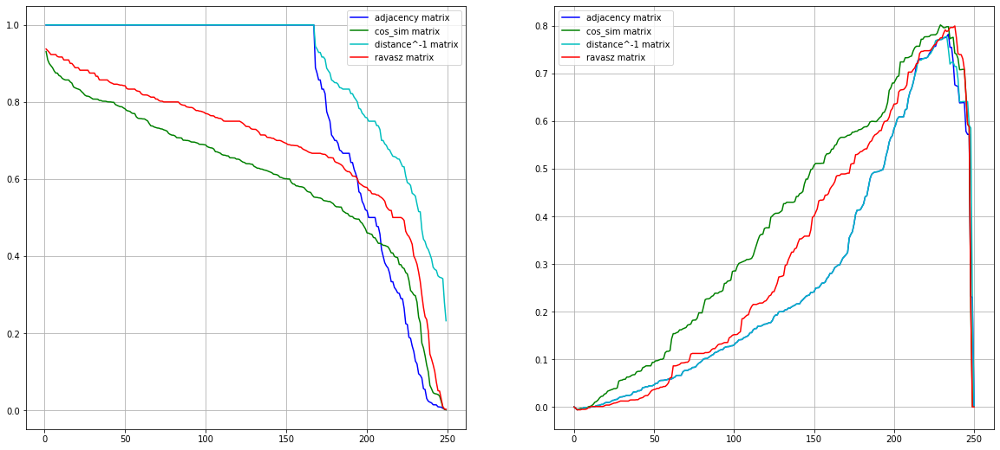

In [54]:
def comm_sim(s_m, c_1,c_2):
    counter=0
    sim_v=0
    for c_1_n in c_1:
        for c_2_n in c_2:
            sim_v+=s_m[c_1_n][c_2_n]
            counter+=1
            
    return sim_v/counter

def find_most_sim(comms, comp_matrix):
    max=0
    found_comms=None
    
    if len(comms)==1:
        return None
    
    for c_1 in comms:
        for c_2 in comms:
            if c_1[0]>=c_2[0]:
                continue
            t_sim=comm_sim(comp_matrix, c_1, c_2)
            if t_sim>=max:
                found_comms=c_1,c_2
                max=t_sim
                
    return found_comms, max
                
def merge_comm(comms, c_1,c_2):
    if c_1 not in comms or c_2 not in comms:
        print("ERR")
        return
    new_comm=[]
    for cm in comms:
        if cm!= c_1 and cm!= c_2:
            new_comm.append(cm)
    new_comm.append(c_1+c_2)
    return new_comm
        
                
def agglomerate_comp_matrix(comp_matrix, verbose=1, stop_min_size=None, get_modularity_step=1, graph=None, pocket_max_mod=True):
    comms=[ [n] for n,_ in enumerate(comp_matrix)]
    step_counter=0
    simval_list=[]
    stop_condition=False
    mod={0:0}
    pck_maxmod=0
    pck_comms=None
    while True:
        step_counter+=1
        f_cs = find_most_sim(comms, comp_matrix)
        if f_cs!=None:
            comms=merge_comm(comms, f_cs[0][0], f_cs[0][1])
        else:
            break
        if verbose==2:
            print(" step", step_counter,":  joined community", f_cs[0][0],"and", f_cs[0][1]," with similarity value", f_cs[1])
        if verbose==1:
            print("  step", step_counter,": found ", len(comms), "communities      ", end='\r')
            
#         if stop_min_size!=None:
#             for comm in comms:
#                 if len(comm)< stop_min_size:   #stop_min_size fornisce la minima grandezza che tutte le community devono avere per poter stoppare l'agglomerazione
#                     #quindi se ne trovo una con una dimensione minore devo continuare
#                     stop_condition=False
#                     break
#                 stop_condition=True
#                 #IMPLEMENTA IGNORA GLI ISOLATI
        if get_modularity_step!=0 and (step_counter)%get_modularity_step==0 or step_counter-1==N_AGENTS:
            mod[step_counter+1]=modularity(graph, comms)
     
        simval_list.append(f_cs[1])
        
        if pocket_max_mod:
            if mod[step_counter+1]>=pck_maxmod:
                pck_maxmod=mod[step_counter+1]
                pck_comms=copy.deepcopy(comms)
        
    print("\n\n")
    return pck_comms, np.array(simval_list).reshape(-1,1), mod
    
plt.figure(figsize=(20,9))

adj_pck_comm, simval, mod=agglomerate_comp_matrix(mtr_adj, graph=comm_net)
# print(simval)
plt.subplot(1,2,1)
plt.plot(list(range(1,N_AGENTS)), simval, color='b', label='adjacency matrix')
plt.subplot(1,2,2)
plt.plot(dictoarr(mod, 'keys'), dictoarr(mod), color='b', label='adjacency matrix')

cos_pck_comm, simval, mod =agglomerate_comp_matrix(mtr_cos, graph=comm_net) 
# print(simval)
plt.subplot(1,2,1)
plt.plot(list(range(1,N_AGENTS)), simval, color='g', label='cos_sim matrix')
plt.subplot(1,2,2)
plt.plot(dictoarr(mod, 'keys'), dictoarr(mod), color='g', label='cos_sim matrix')

dst_pck_comm, simval, mod=agglomerate_comp_matrix(mtr_dst, graph=comm_net)   
# print(simval)
plt.subplot(1,2,1)
plt.plot(list(range(1,N_AGENTS)), simval, color='c', label= 'distance^-1 matrix')
plt.subplot(1,2,2)
plt.plot(dictoarr(mod, 'keys'), dictoarr(mod), color='c', label= 'distance^-1 matrix')

rvz_pck_comm, simval, mod=agglomerate_comp_matrix(mtr_rvz, graph=comm_net)   
# print(simval)
plt.subplot(1,2,1)
plt.plot(list(range(1,N_AGENTS)), simval, color='r', label= 'ravasz matrix')
plt.subplot(1,2,2)
plt.plot(dictoarr(mod, 'keys'), dictoarr(mod), color='r', label= 'ravasz matrix')

plt.subplot(1,2,1)
plt.legend()
plt.grid()

plt.subplot(1,2,2)
plt.legend()
plt.grid()

plt.show()

In [55]:
def print_partition(partition, mtr_name=None):
    if mtr_name!=None:
        print("partition by agglomeration of", mtr_name,"matrix:", "-"*80 )
    for n, comm in enumerate(sorted(partition, key=len)):
        print("partition ", n+1,":  ", sorted(comm))
        
    print("\n")
    
print_partition(adj_pck_comm, "adj")
print_partition(dst_pck_comm, "dst")
print_partition(cos_pck_comm, "cos")
print_partition(rvz_pck_comm, "ravasz")

partition by agglomeration of adj matrix: --------------------------------------------------------------------------------
partition  1 :   [56]
partition  2 :   [59]
partition  3 :   [136]
partition  4 :   [201]
partition  5 :   [219]
partition  6 :   [79, 156]
partition  7 :   [15, 133, 245]
partition  8 :   [31, 55, 73, 99, 236]
partition  9 :   [14, 22, 68, 74, 151, 191, 226, 238]
partition  10 :   [26, 42, 47, 48, 67, 80, 85, 89, 154, 158, 163, 166, 177, 183, 212, 218]
partition  11 :   [1, 6, 13, 17, 29, 45, 51, 58, 70, 77, 104, 141, 165, 173, 182, 234, 249]
partition  12 :   [4, 7, 63, 97, 110, 118, 135, 142, 144, 160, 167, 199, 209, 217, 241, 244, 248]
partition  13 :   [8, 28, 39, 60, 61, 66, 78, 92, 96, 98, 112, 114, 148, 150, 168, 169, 171, 181, 207, 211, 231]
partition  14 :   [19, 35, 46, 54, 82, 84, 87, 93, 94, 109, 116, 125, 126, 130, 134, 145, 147, 157, 172, 187, 214, 232, 235, 242, 243]
partition  15 :   [2, 18, 21, 23, 53, 64, 65, 69, 75, 83, 106, 115, 117, 119, 120, 

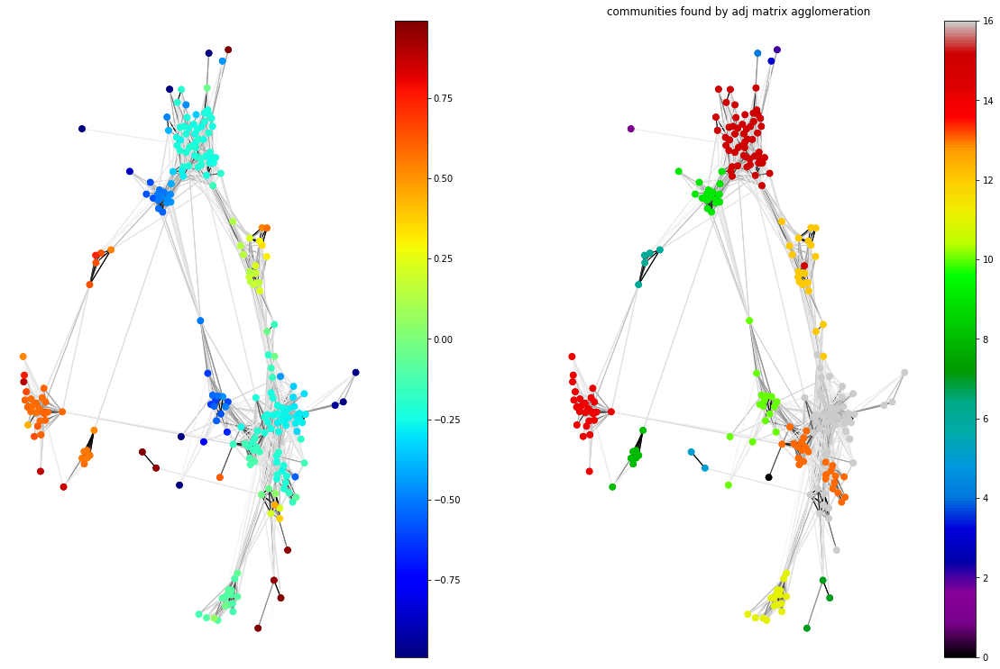

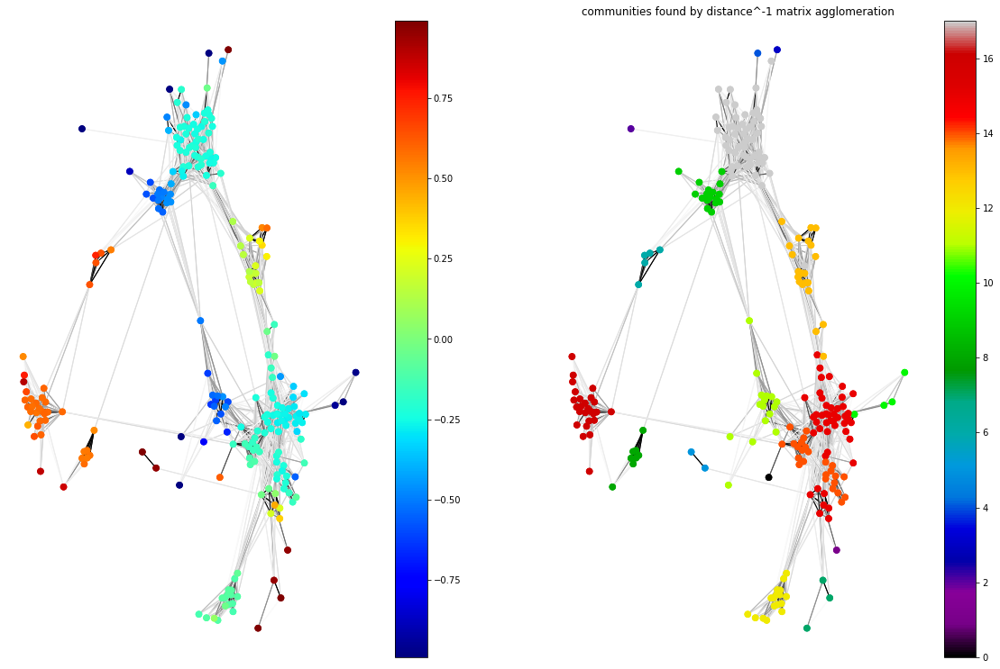

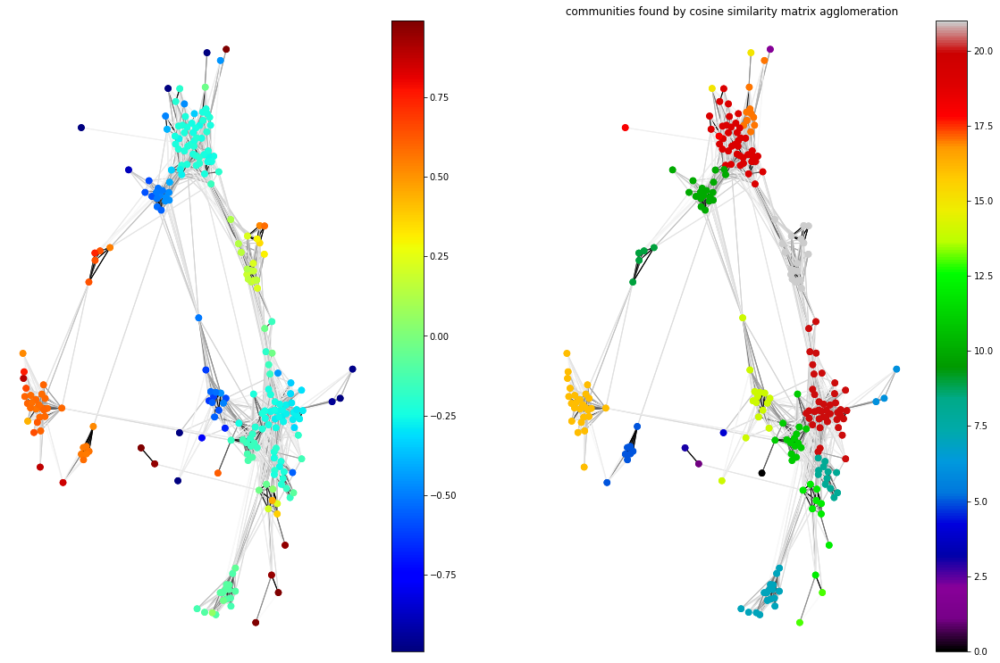

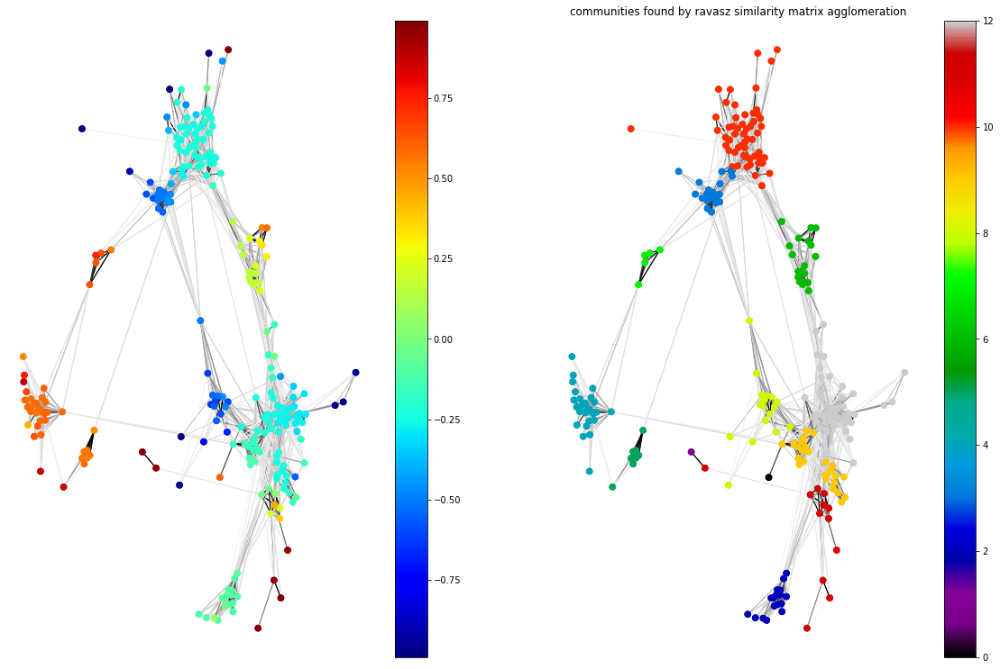

In [56]:
def draw_graph_partition(graph, partition, pos=LAYOUT_POS, title=None):
    comm_dict={}
    for n, comm in enumerate(partition):
        comm_dict[n]=comm
    
    t_graph=copy.deepcopy(graph)
    
    for node in t_graph.nodes():
        for n, comm in comm_dict.items():
            if node in comm:
                t_graph.nodes[node]['comm']=n
                break
    
    plt.figure(figsize=(20,13))
    plt.title(title)
    plt.subplot(1,2,1)
    draw_graph(t_graph, pos=LAYOUT_POS, node_color_attribute='opinion', node_cmap='jet', show=False)
    plt.subplot(1,2,2)
    draw_graph(t_graph, pos=LAYOUT_POS, node_color_attribute='comm', node_cmap='nipy_spectral', show=False)
#     plt.subplot(1,2,(1,2))
    plt.title(title)
    plt.show()

draw_graph_partition(comm_net, adj_pck_comm, title="communities found by adj matrix agglomeration")
draw_graph_partition(comm_net, dst_pck_comm, title="communities found by distance^-1 matrix agglomeration")
draw_graph_partition(comm_net, cos_pck_comm, title="communities found by cosine similarity matrix agglomeration")
draw_graph_partition(comm_net, rvz_pck_comm, title="communities found by ravasz similarity matrix agglomeration")

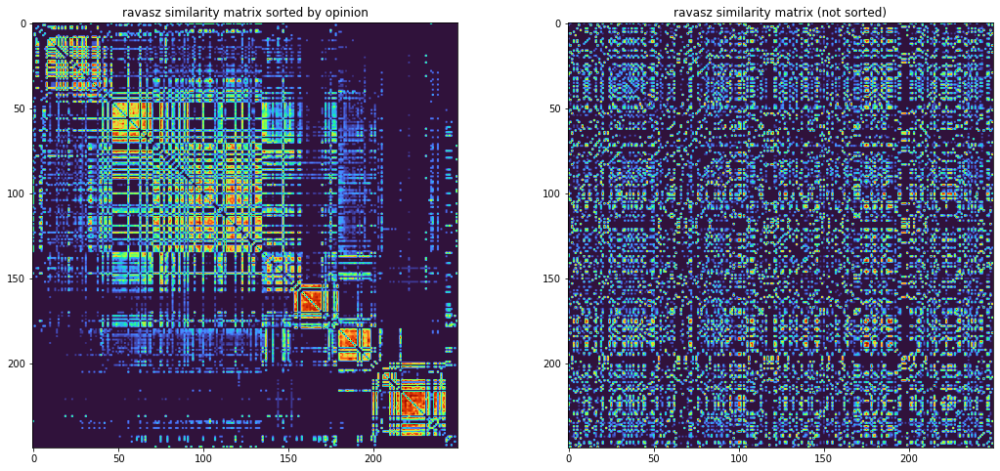

  step 249 : found  1 communities      




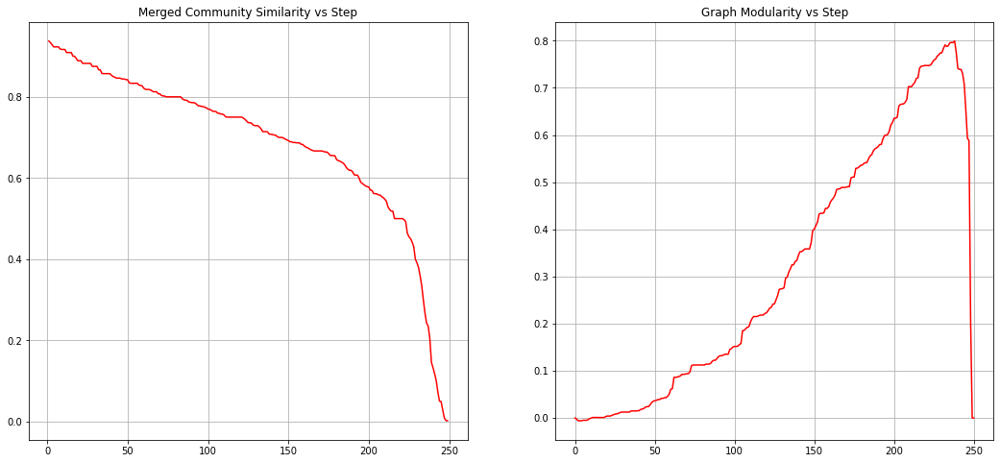

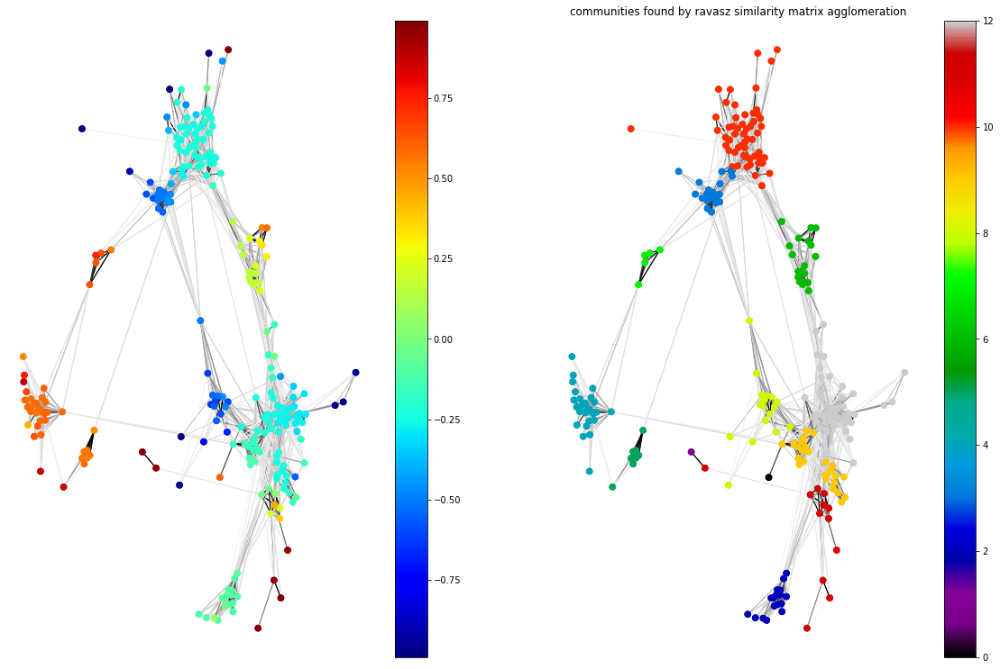

In [57]:
def community_detection(comm_net, method='agg_ravasz'):
    
    if method!='agg_ravasz':
        print("NON IMPLEMENTATO")
        return
    
    plt.figure(figsize=(18,8))
    plt.subplot(1,2,1)
    mtr_cmp=get_comparison_matrix(comm_net, ravasz_sim, sort_by_attribute='opinion')
    plt.imshow(mtr_cmp, cmap='turbo')
    plt.title("ravasz similarity matrix sorted by opinion")
    plt.subplot(1,2,2)
    mtr_cmp=get_comparison_matrix(comm_net, ravasz_sim, sort_by_attribute=None)
    plt.imshow(mtr_cmp, cmap='turbo')
    plt.title("ravasz similarity matrix (not sorted)")
    plt.show()
    
    rvz_pck_comm, simval, mod=agglomerate_comp_matrix(mtr_cmp, graph=comm_net)   
    # print(simval)
    plt.figure(figsize=(18,8))
    plt.subplot(1,2,1)
    plt.plot(list(range(1,N_AGENTS)), simval, color='r')
    plt.title('Merged Community Similarity vs Step')
    plt.grid()
    plt.subplot(1,2,2)
    plt.plot(dictoarr(mod, 'keys'), dictoarr(mod), color='r')
    plt.title('Graph Modularity vs Step')
    plt.grid()
    plt.show()
    
    draw_graph_partition(comm_net, rvz_pck_comm, title="communities found by ravasz similarity matrix agglomeration")

community_detection(comm_net)




                   ----------------==========[ pref_att value: 0.00 ]=========----------------


                                                                                                                                                                                                                                                                                                            


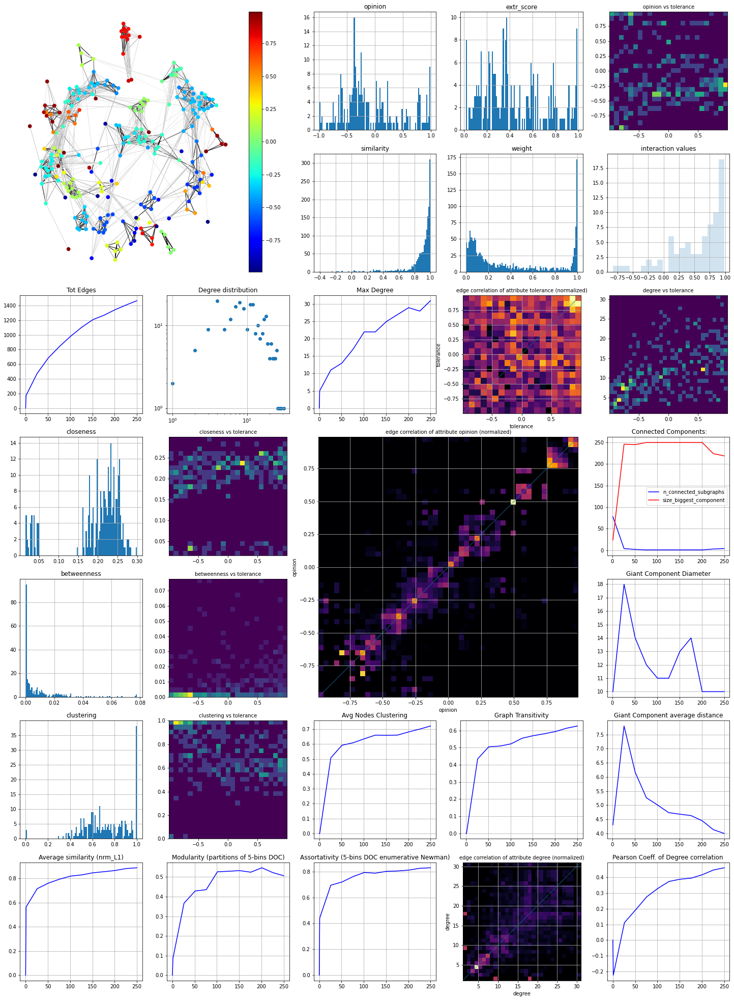

                                                                                                                                                                                                                                                                                                            
    [==================================================]      generation completed; Total time: 80.19 s; avg time/step: 0.32 s 


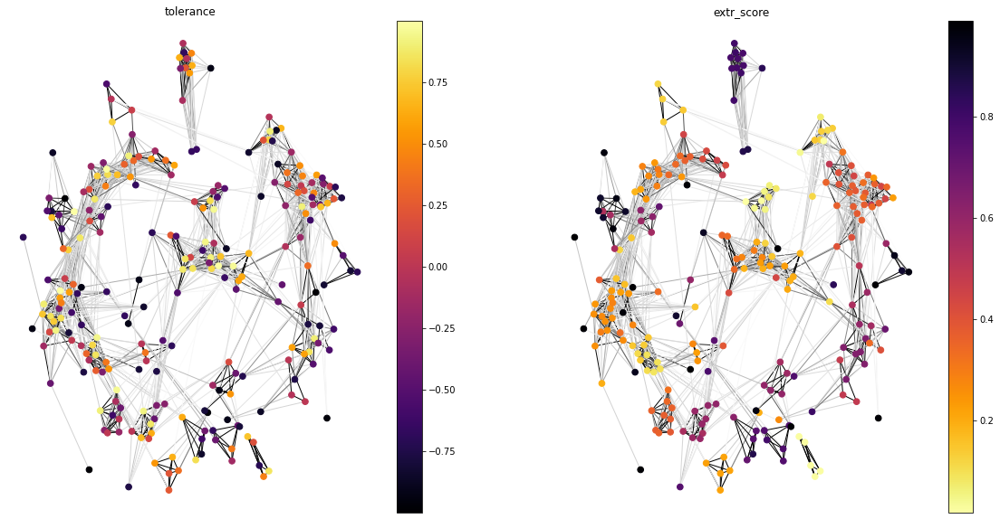

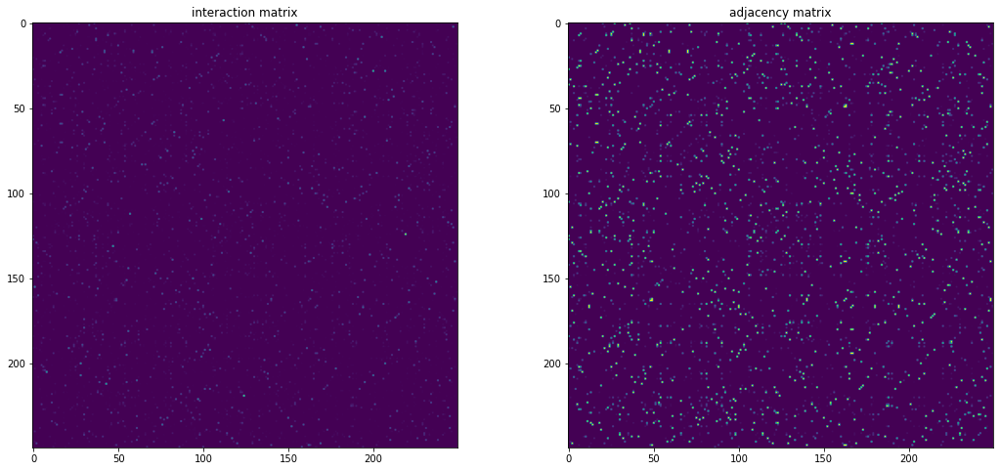

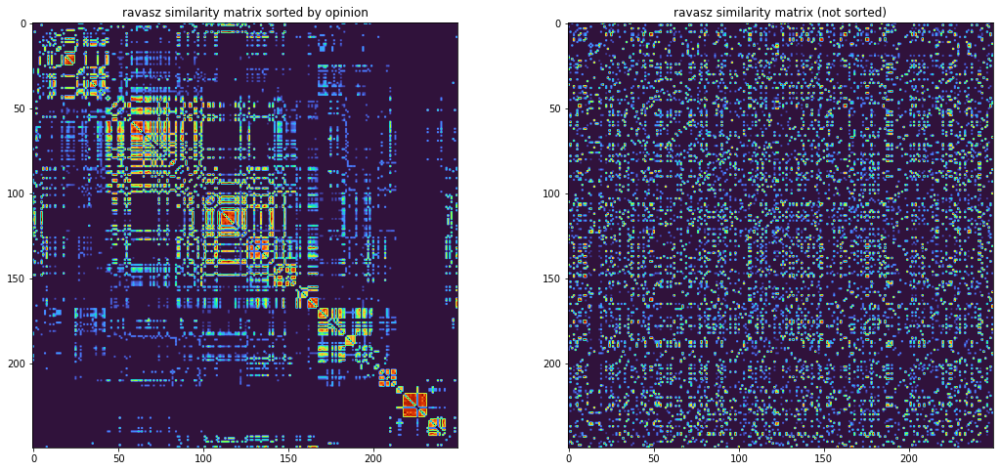

  step 249 : found  1 communities      




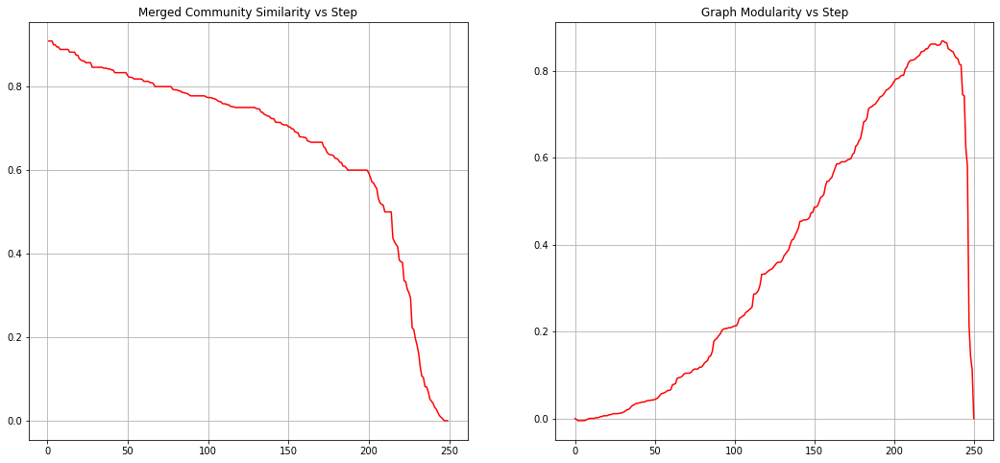

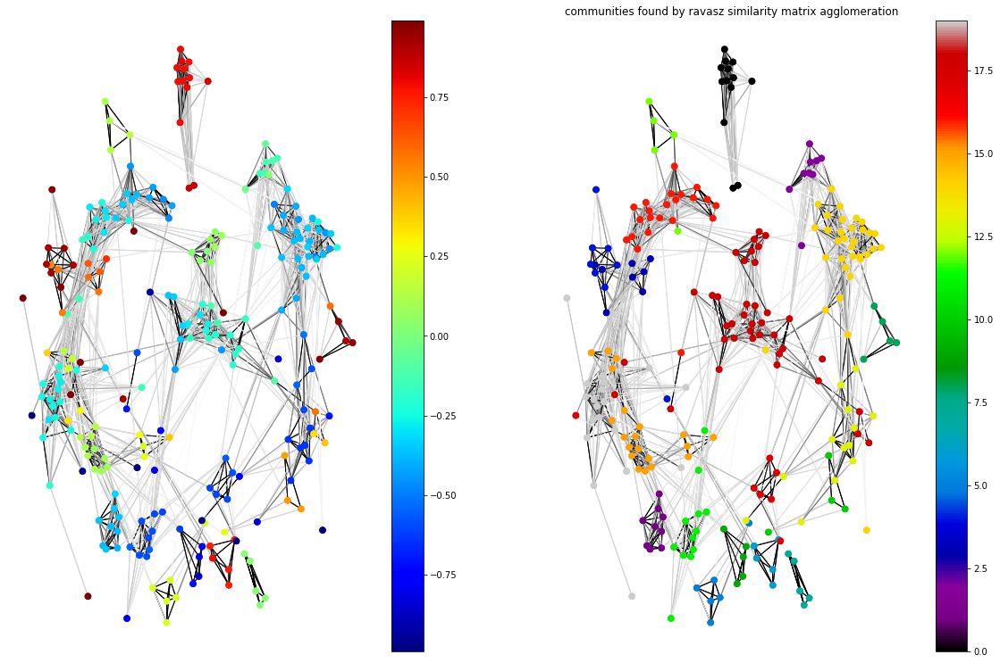




                   ----------------==========[ pref_att value: 0.20 ]=========----------------


                                                                                                                                                                                                                                                                                                            


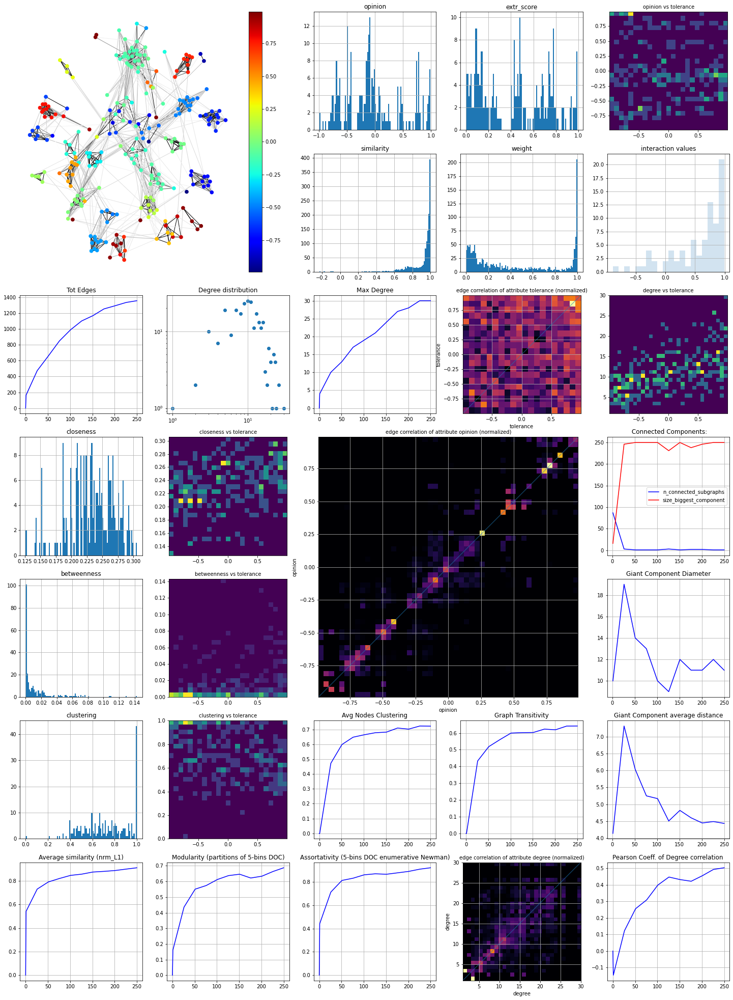

                                                                                                                                                                                                                                                                                                            
    [==================================================]      generation completed; Total time: 78.26 s; avg time/step: 0.31 s 


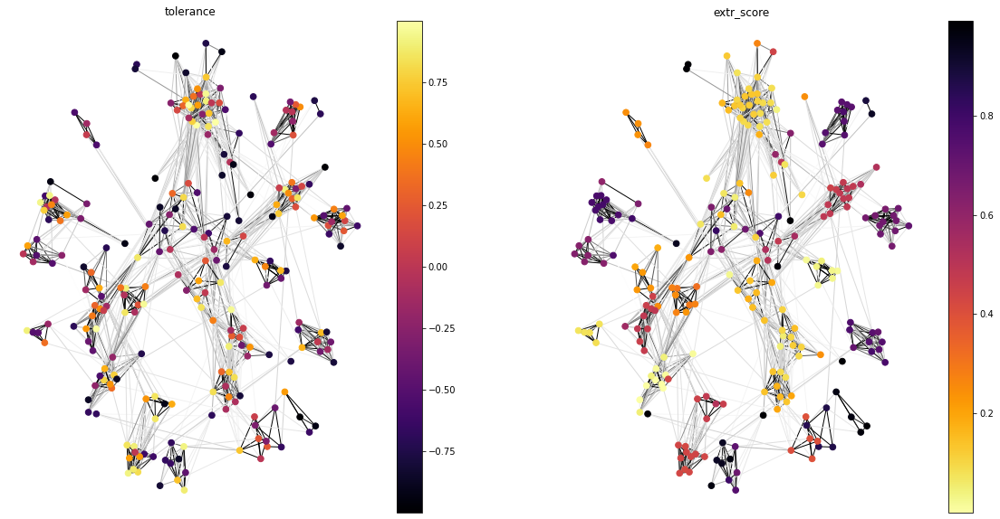

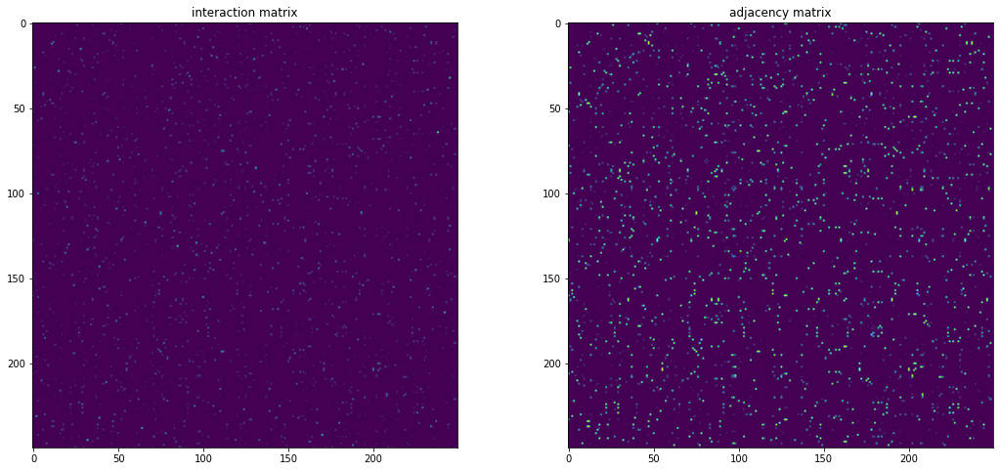

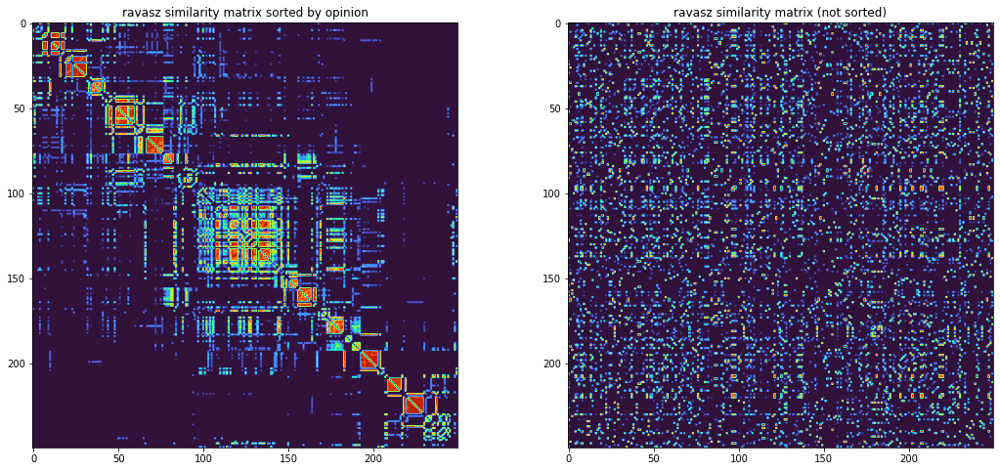

  step 249 : found  1 communities      




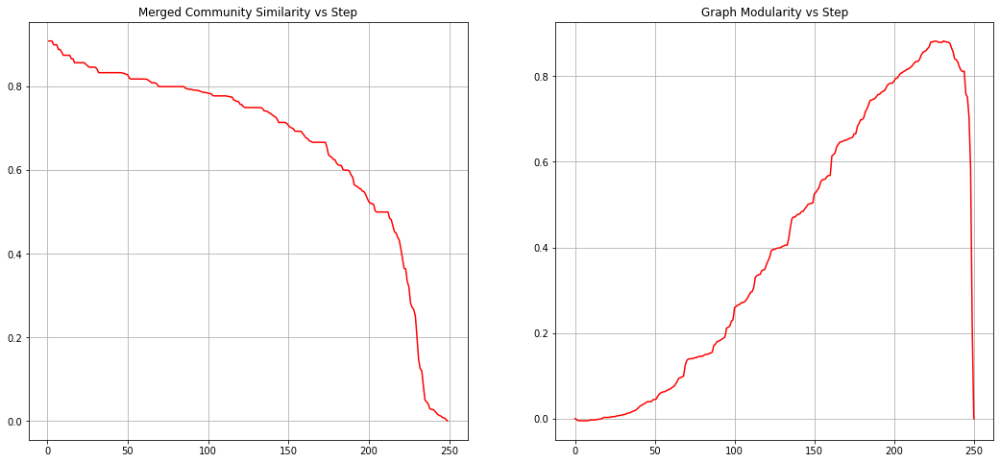

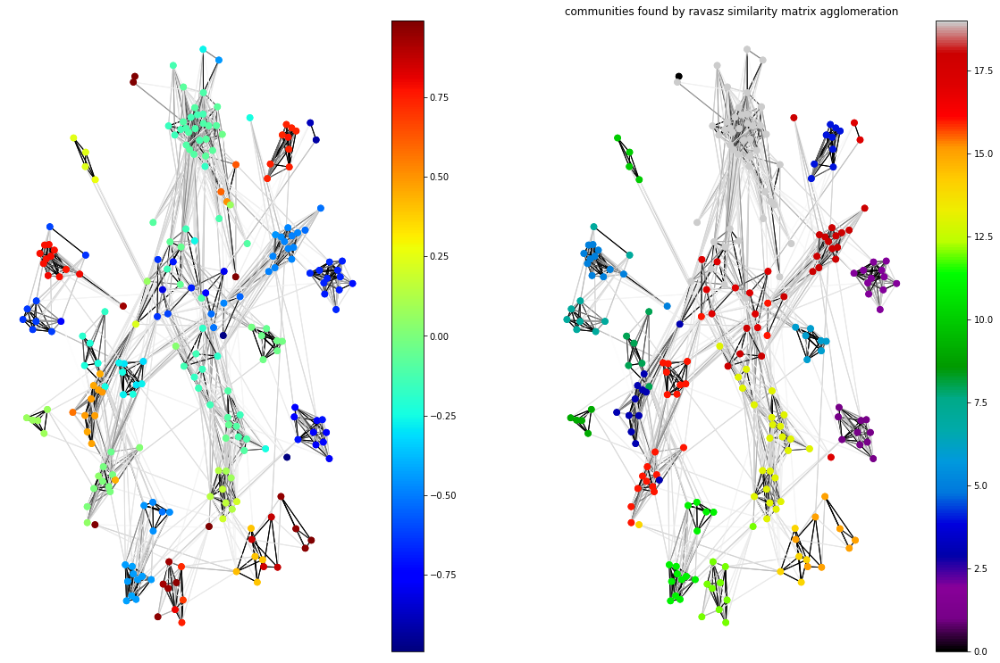




                   ----------------==========[ pref_att value: 0.50 ]=========----------------


                                                                                                                                                                                                                                                                                                            


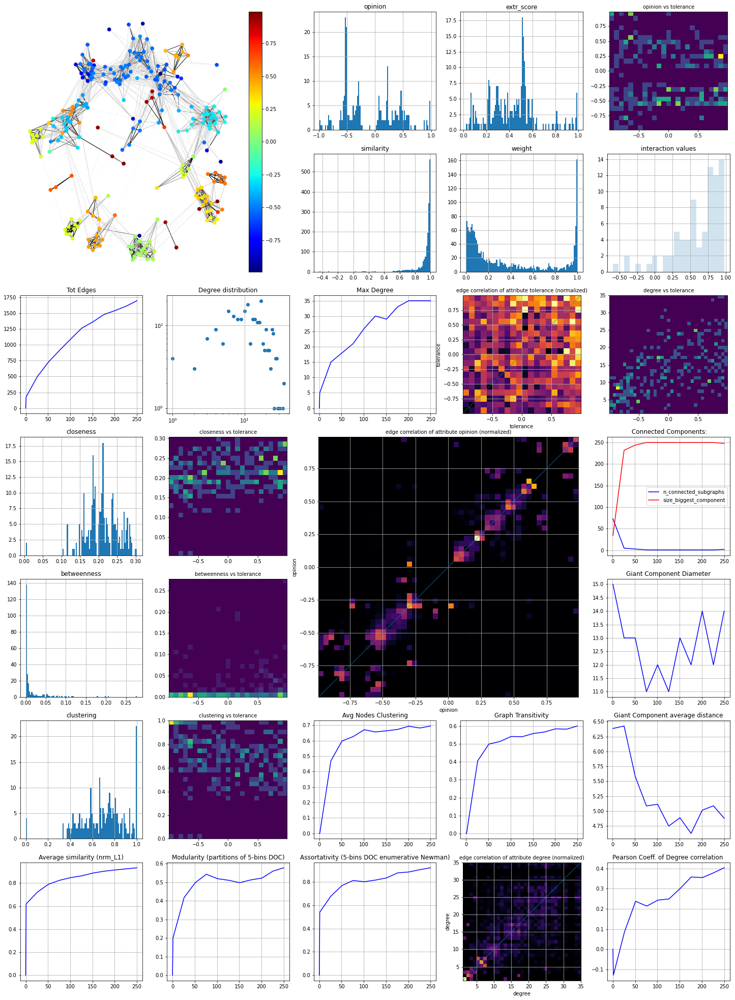

                                                                                                                                                                                                                                                                                                            
    [==================================================]      generation completed; Total time: 86.18 s; avg time/step: 0.34 s 


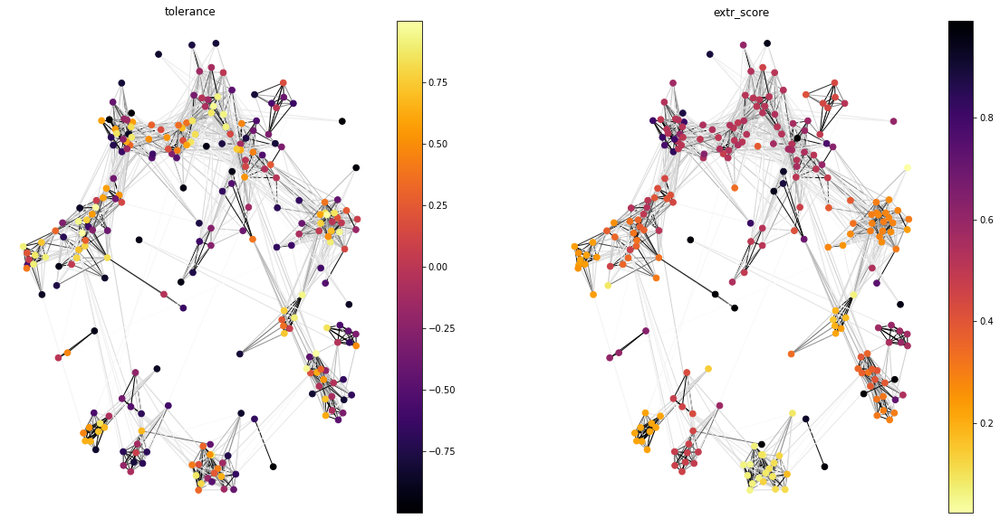

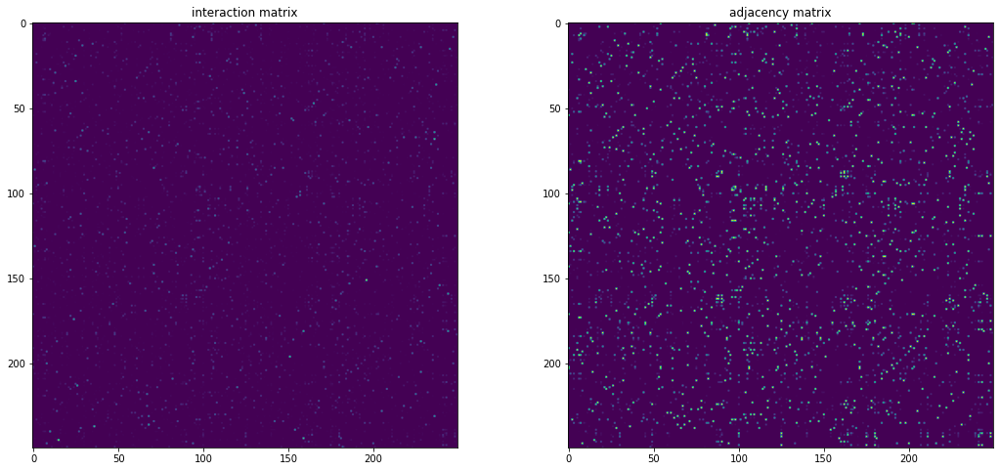

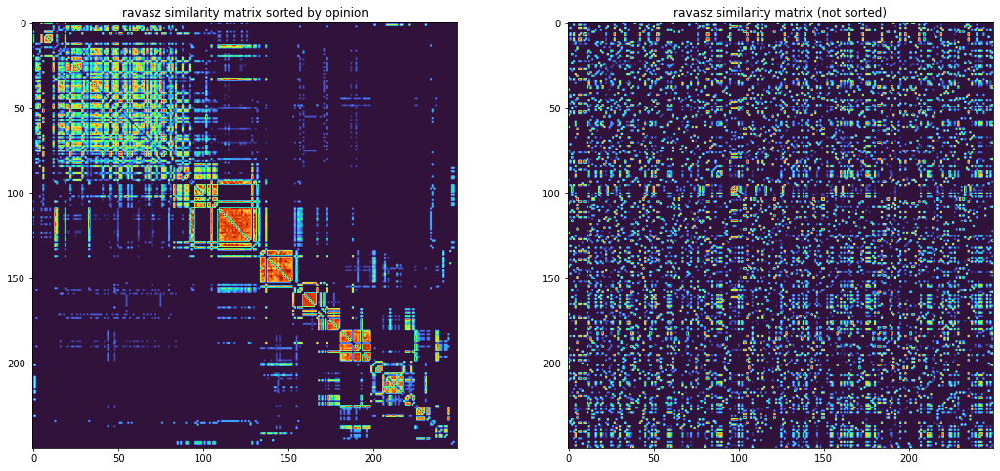

  step 249 : found  1 communities      




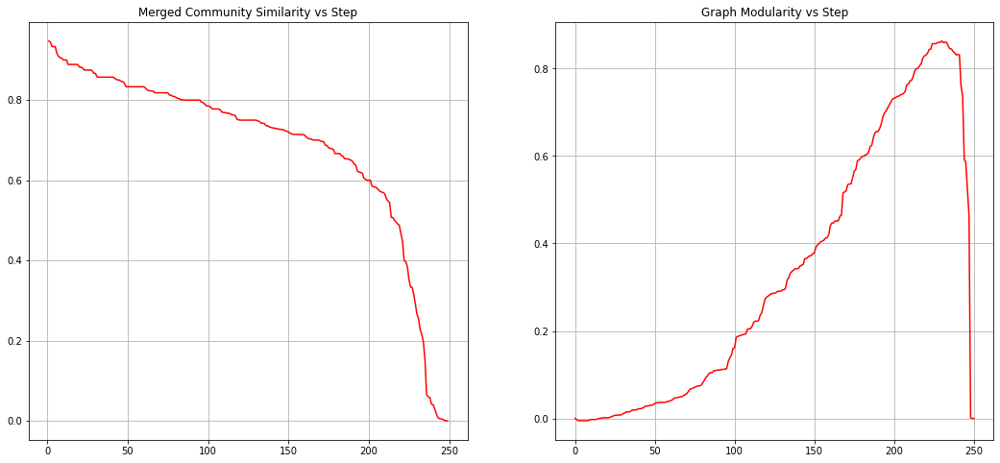

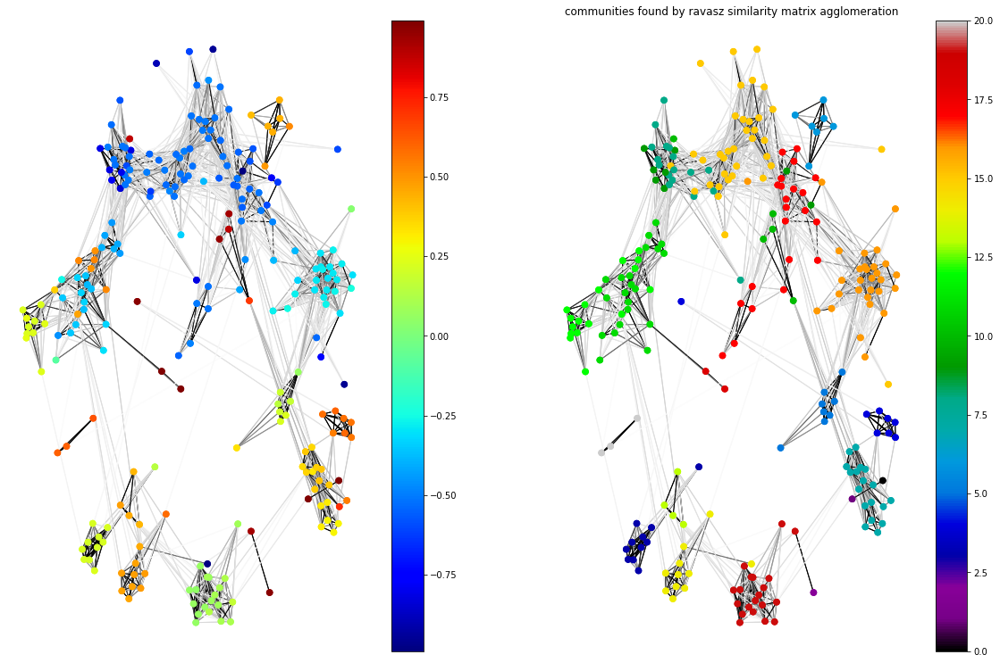




                   ----------------==========[ pref_att value: 1.00 ]=========----------------


                                                                                                                                                                                                                                                                                                            


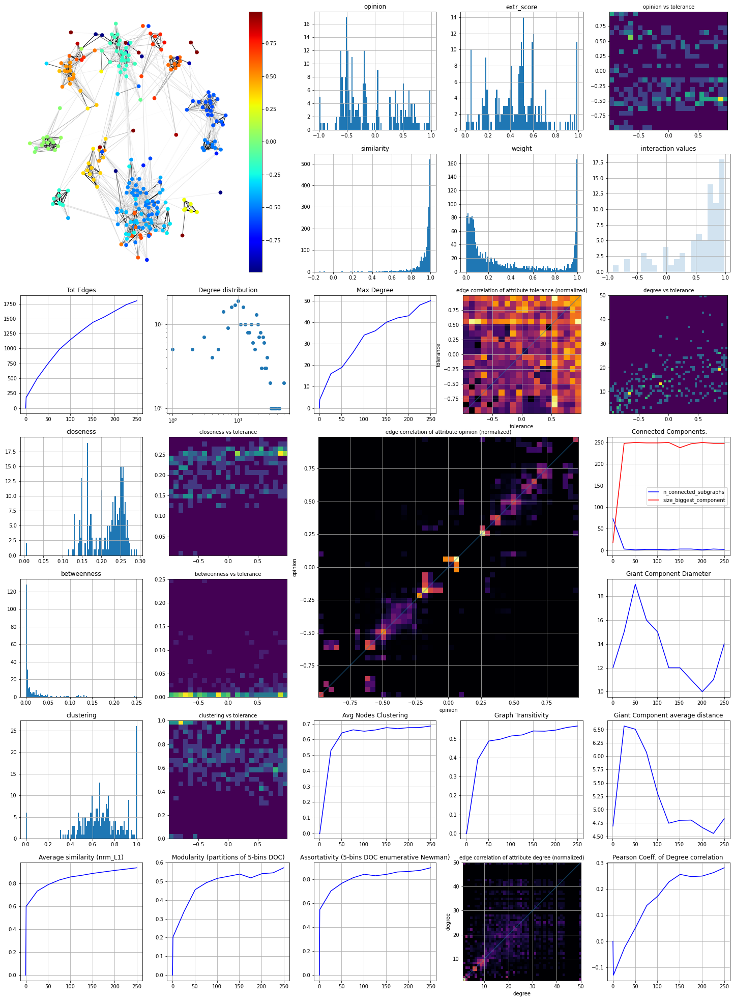

                                                                                                                                                                                                                                                                                                            
    [==================================================]      generation completed; Total time: 89.46 s; avg time/step: 0.36 s 


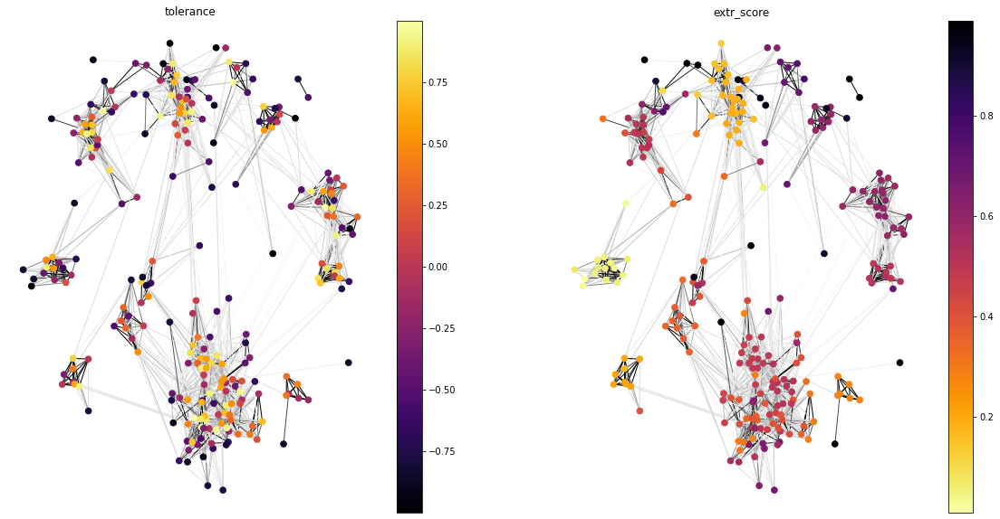

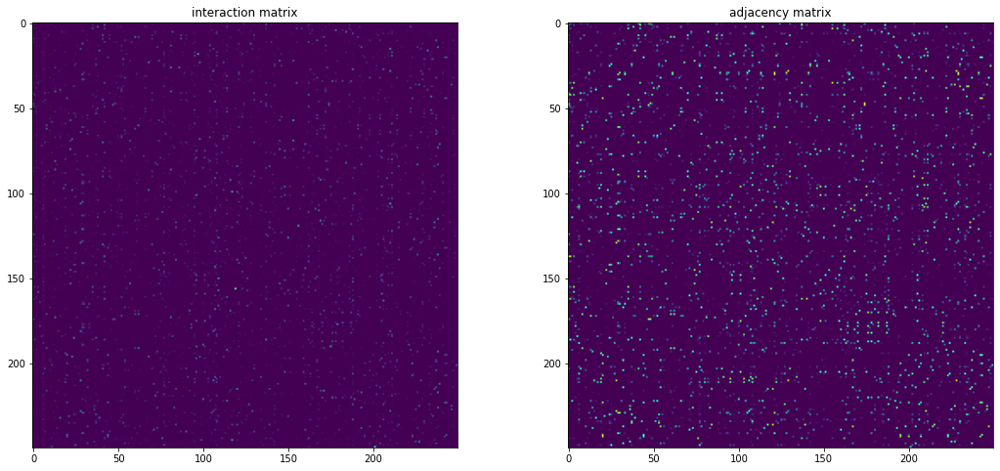

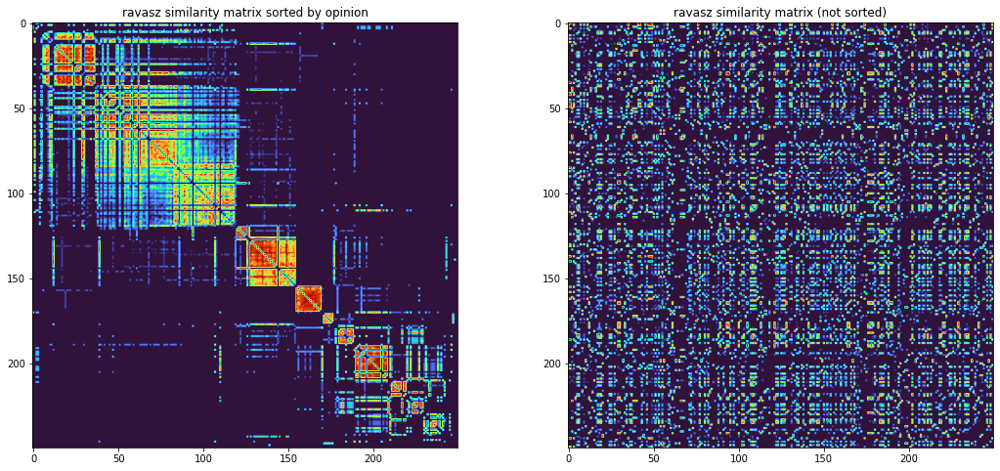

  step 249 : found  1 communities      




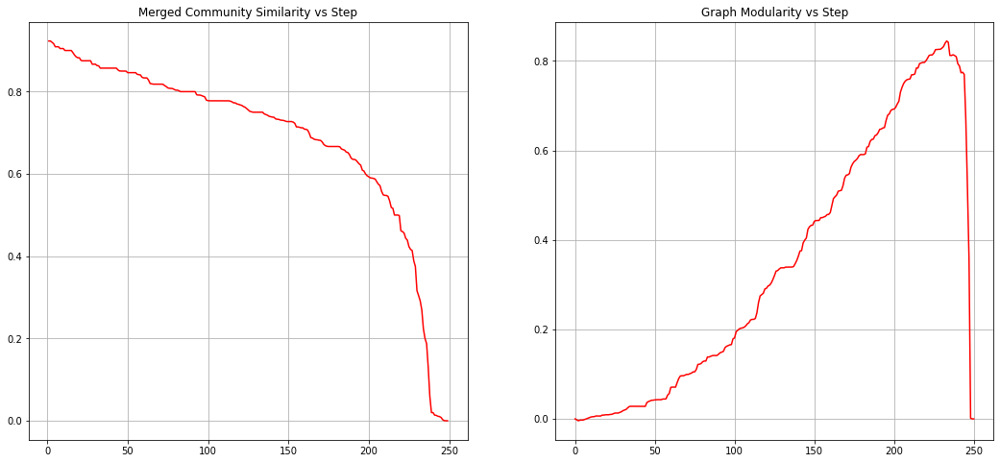

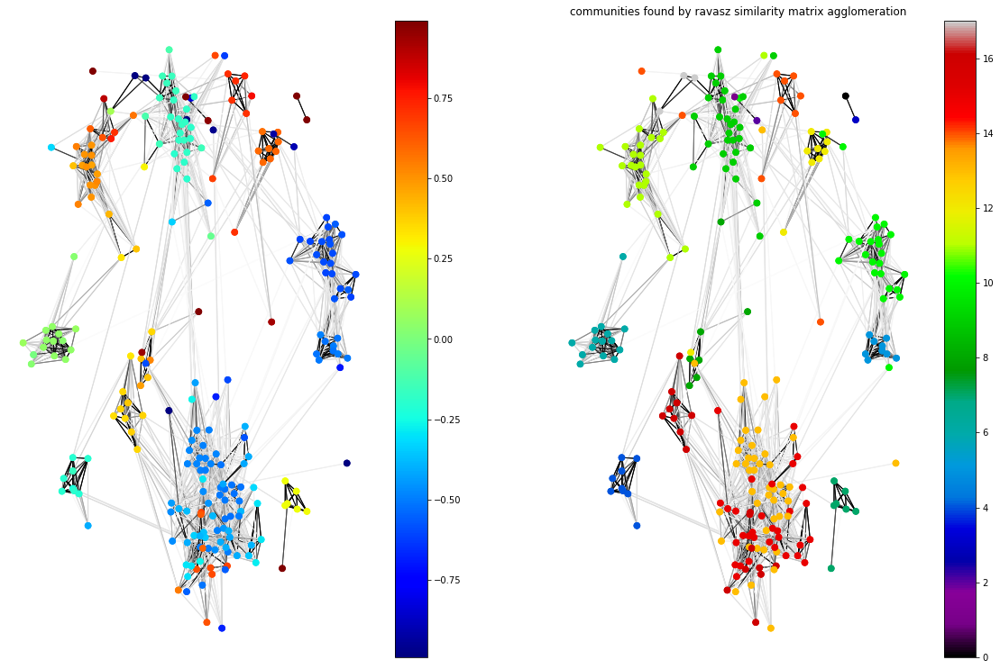




                   ----------------==========[ pref_att value: 1.50 ]=========----------------


                                                                                                                                                                                                                                                                                                            


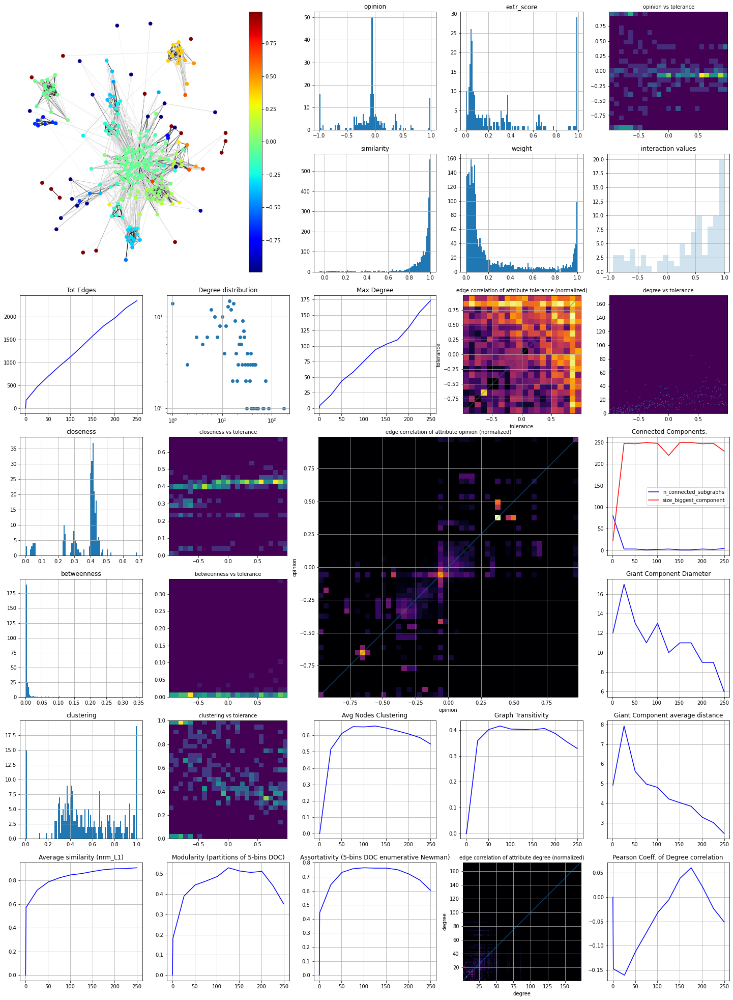

                                                                                                                                                                                                                                                                                                            
    [==================================================]      generation completed; Total time: 109.59 s; avg time/step: 0.44 s 


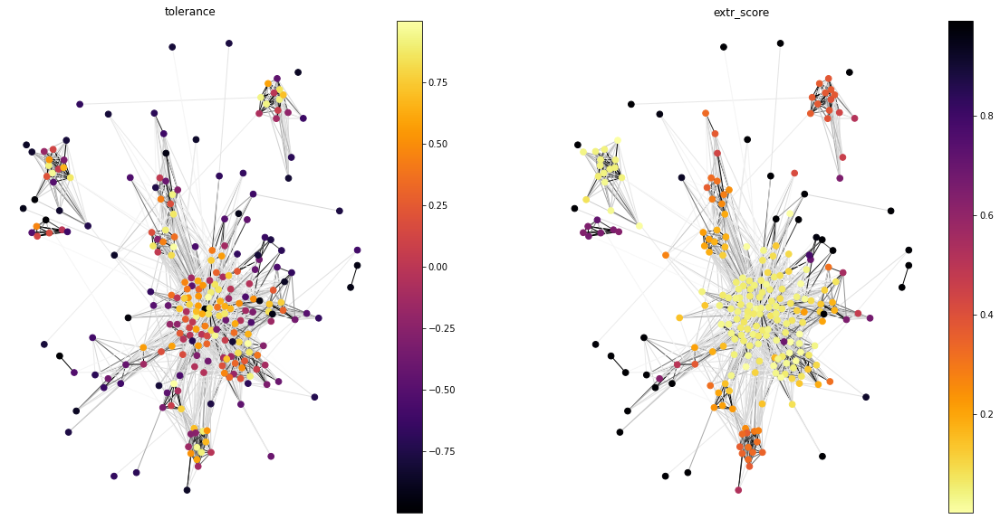

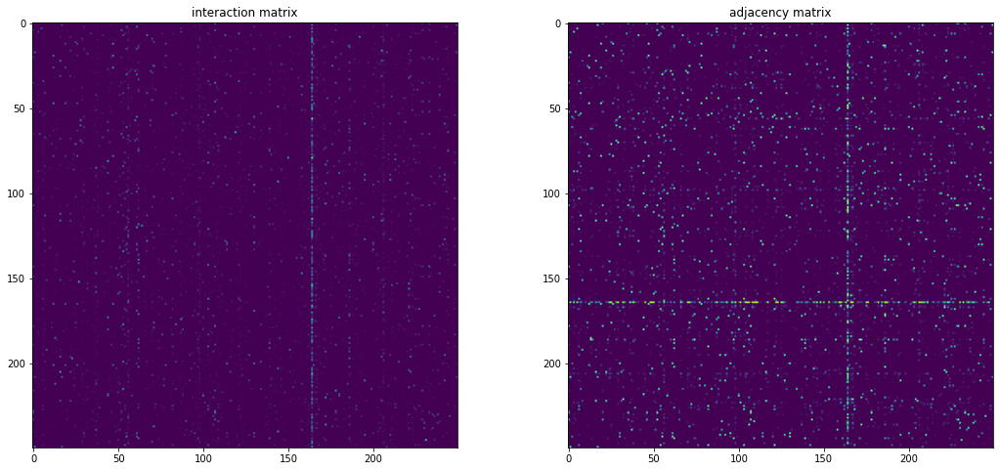

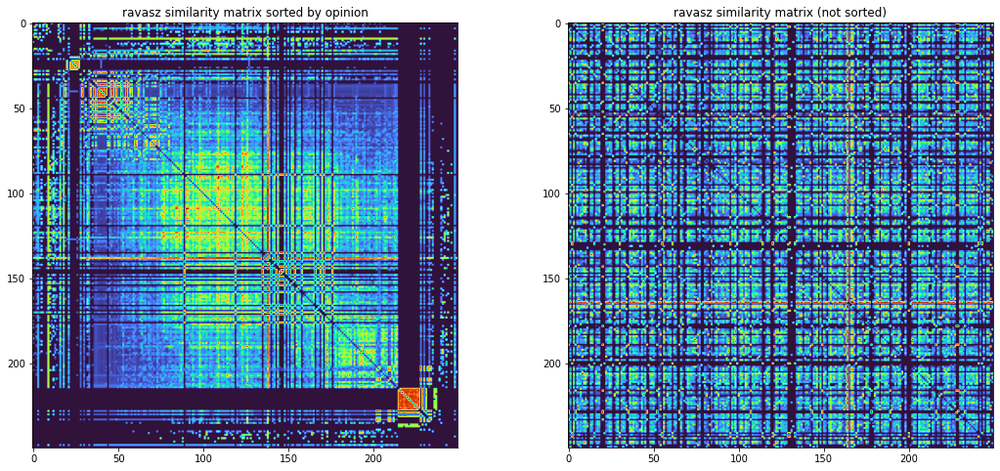

  step 249 : found  1 communities      




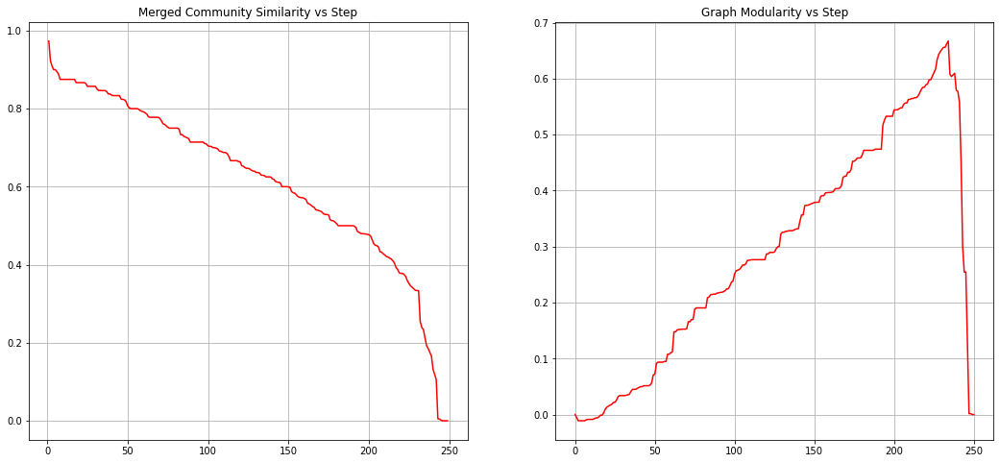

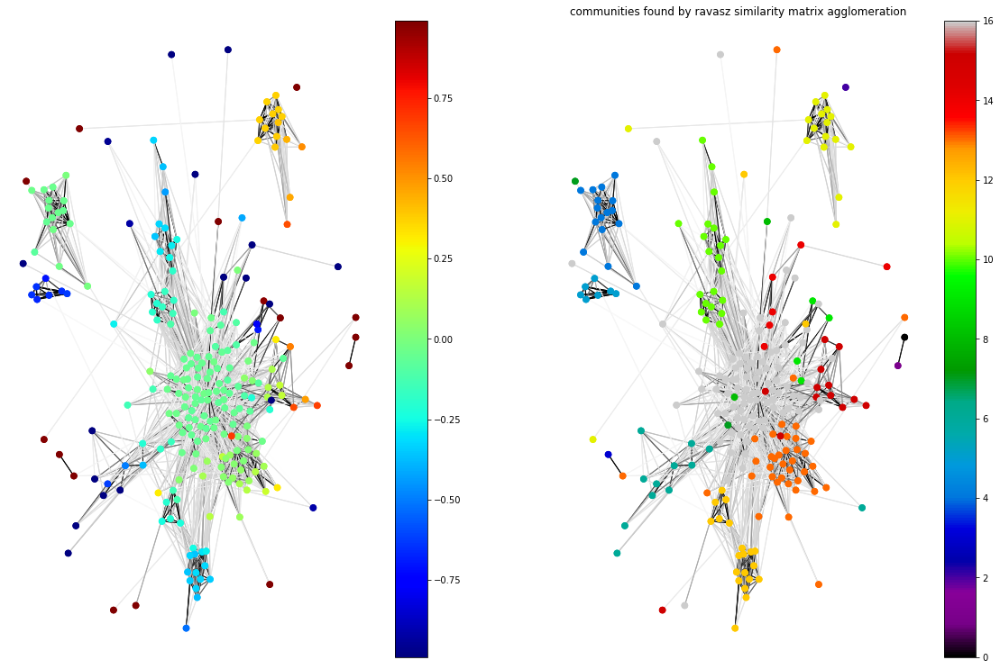




                   ----------------==========[ pref_att value: 2.00 ]=========----------------


                                                                                                                                                                                                                                                                                                            


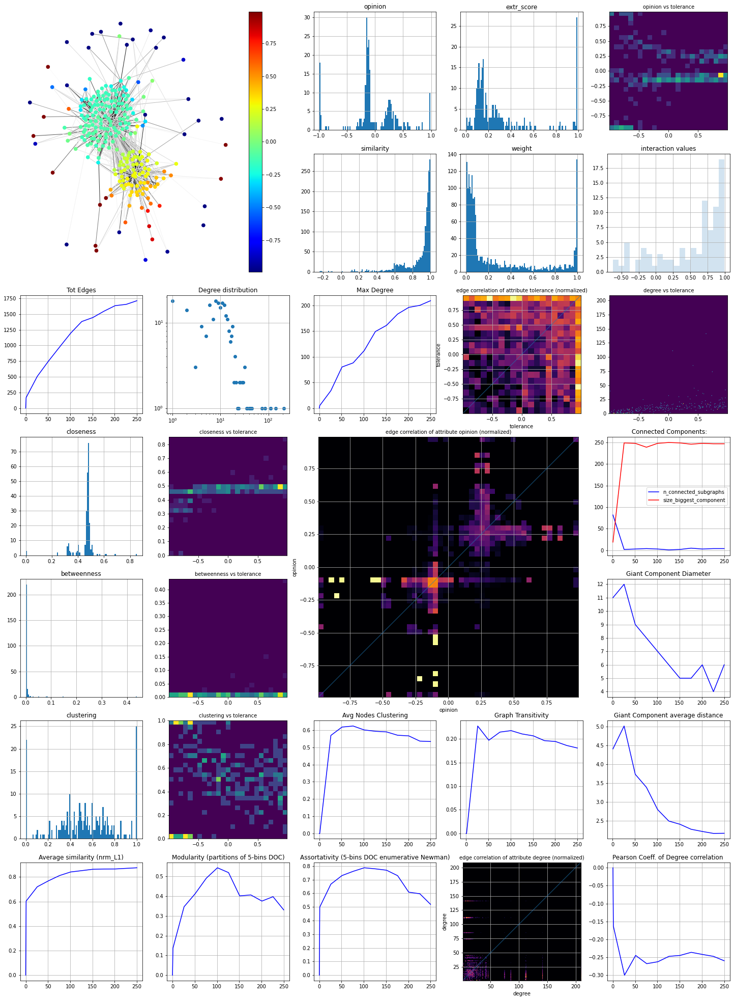

                                                                                                                                                                                                                                                                                                            
    [==================================================]      generation completed; Total time: 134.94 s; avg time/step: 0.54 s 


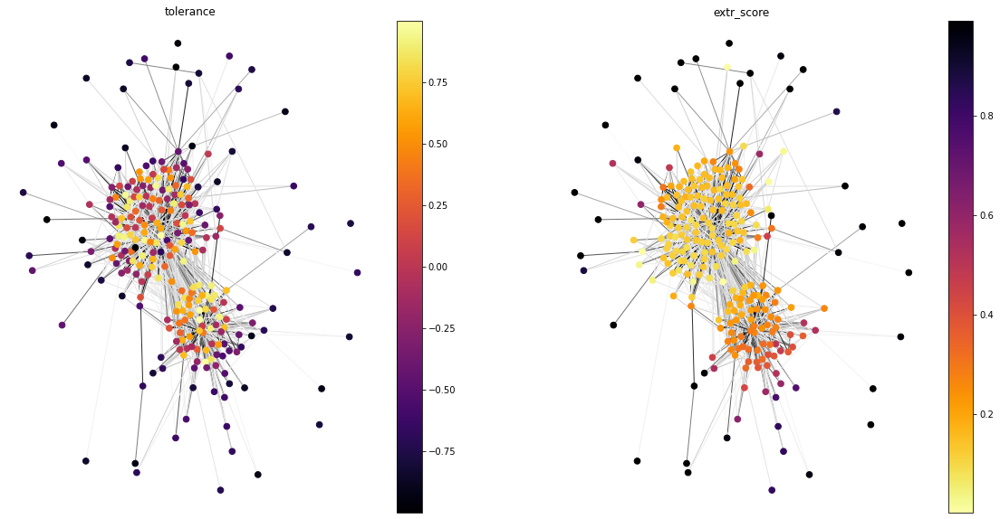

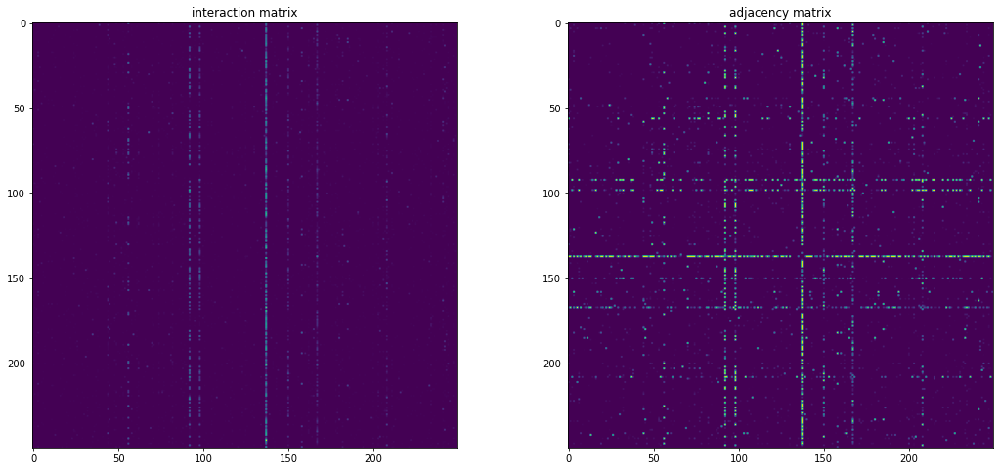

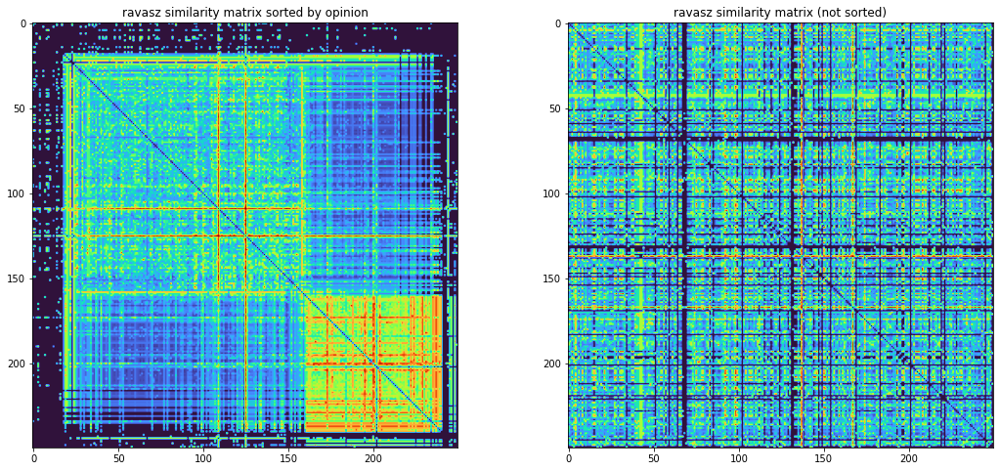

  step 249 : found  1 communities      




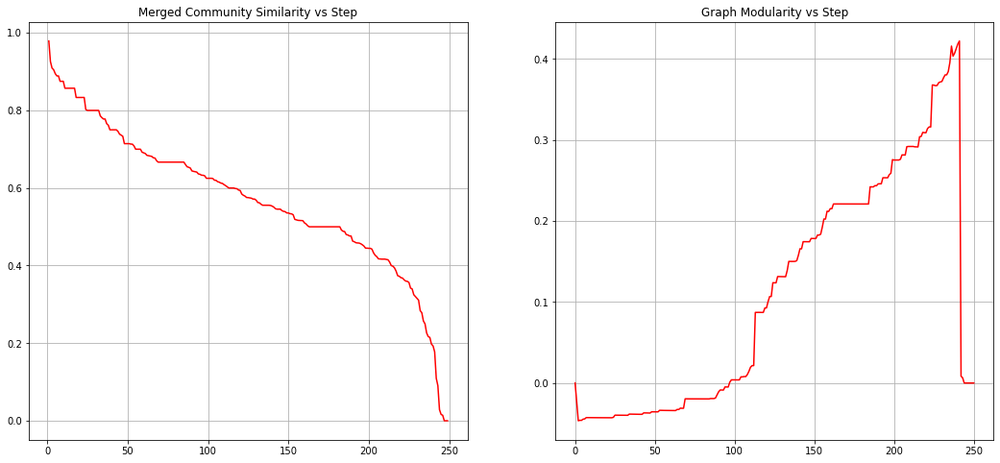

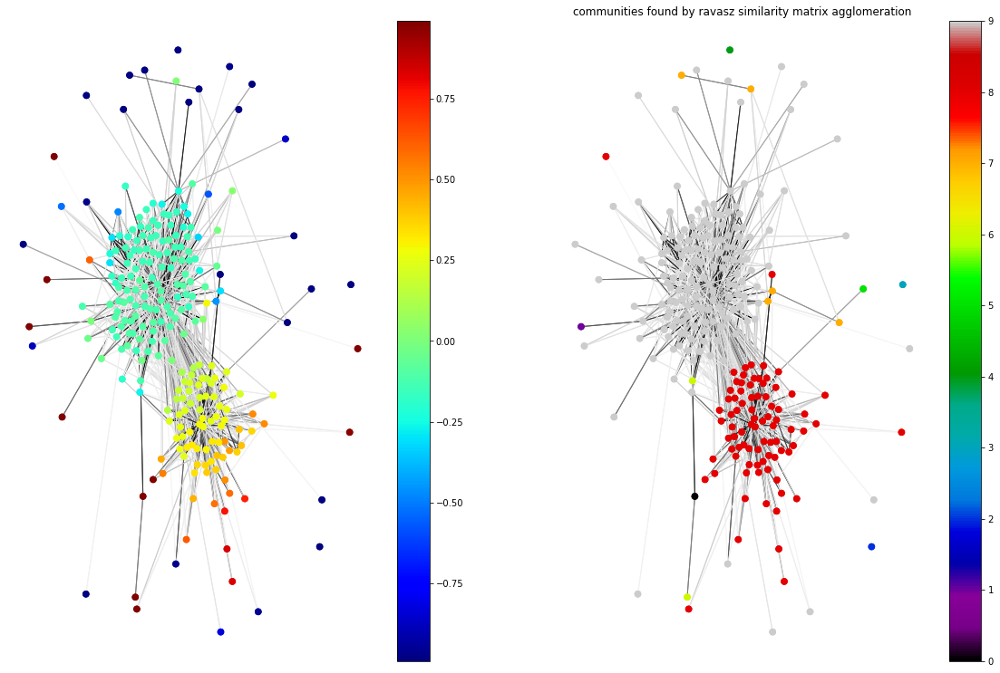

In [58]:
MODELPAR_TEST=True

pref_att_testvalue=[0.0,
                    0.2,
                    0.5,
                    1.0,
                    1.5,
                    2.0
                   ]

test_commnet={}
test_metrics={}
test_intmatr={}
if MODELPAR_TEST:
    for n, t_val in enumerate(pref_att_testvalue):
        print("\n\n")
        print("                   ----------------==========[ pref_att value: {:2.2f} ]=========----------------".format(t_val) )
        print("\n")
        t_net, t_met, t_intm= Generate_Commnet(init_net,fast_vis=True, PREFERENTIAL_ATTACHMENT_BASE_EXPONENT=t_val)
        test_commnet[t_val]=t_net
        test_metrics[t_val]=t_net
        test_intmatr[t_val]=t_intm
        
        show_tollextr_graphcorr(t_net)
        show_inter_adj_matrix(t_net, t_intm)
        community_detection(t_net)